# Машинное обучение, ФКН ВШЭ

## Практическое задание 2. Exploratory Data Analysis и линейная регрессия

### Общая информация
Дата выдачи: 25.09.2022

Мягкий дедлайн: 23:59MSK 10.10.2022

Жесткий дедлайн: 23:59MSK 18.10.2022

### О задании
В этом задании мы попытаемся научиться анализировать данные и выделять из них полезные признаки. Мы также научимся пользоваться `seaborn` и `sklearn`, а заодно привыкнем к основным понятиям машинного обучения.

### Оценивание и штрафы
Каждая из задач имеет определенную «стоимость» (указана в скобках около задачи). Максимально допустимая оценка за работу — 10 баллов. Проверяющий имеет право снизить оценку за неэффективную реализацию или неопрятные графики.

**Обратите внимание**, что в каждом разделе домашнего задания есть оцениваниемые задачи и есть вопросы. Вопросы дополняют задачи и направлены на то, чтобы проинтерпретировать или обосновать происходящее. Код без интерпретации не имеет смысла, поэтому отвечать на вопросы обязательно — за отсутствие ответов мы будем снижать баллы за задачи. Если вы ответите на вопросы, но не напишете корректный код к соответствующим оцениваемым задачам, то баллы за такое выставлены не будут.

Сдавать задание после указанного срока сдачи нельзя. При выставлении неполного балла за задание в связи с наличием ошибок на усмотрение проверяющего предусмотрена возможность исправить работу на указанных в ответном письме условиях.

Задание выполняется самостоятельно. «Похожие» решения считаются плагиатом и все задействованные студенты (в том числе те, у кого списали) не могут получить за него больше 0 баллов (подробнее о плагиате см. на странице курса). Если вы нашли решение какого-то из заданий (или его часть) в открытом источнике, необходимо указать ссылку на этот источник в отдельном блоке в конце вашей работы (скорее всего вы будете не единственным, кто это нашел, поэтому чтобы исключить подозрение в плагиате, необходима ссылка на источник).

### Формат сдачи
Задания сдаются через систему Anytask. Инвайт можно найти на странице курса. Присылать необходимо ноутбук с выполненным заданием. Сам ноутбук называйте в формате homework-practice-02-linregr-Username.ipynb, где Username — ваша фамилия.

Для удобства проверки самостоятельно посчитайте свою максимальную оценку (исходя из набора решенных задач) и укажите ниже.

Оценка: **11+** (решено бонусное задание и придуманы новые признаки с расстоянием).

В этом ноутбуке используется библиотека `folium` для визуализации карт. Она работает в google colab!

In [2]:
# !pip install folium

In [1]:
import folium

m = folium.Map(location=(55.7522200, 37.6155600), zoom_start=10)

m

Если вы всё сделали правильно, то выше должна открыться карта Москвы.

In [2]:
import pandas as pd
import numpy as np

# graphics
import matplotlib.pyplot as plt
import seaborn as sns

sns.set(style='darkgrid', palette='deep')

plt.rcParams['figure.figsize'] = 8, 5
plt.rcParams['font.size'] = 12
plt.rcParams['savefig.format'] = 'pdf'

# sklearn
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.linear_model import Ridge, Lasso
from sklearn.preprocessing import OneHotEncoder, StandardScaler
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline

%matplotlib inline
%config InlineBackend.figure_format = 'retina'

## Часть 0. Подготовка (1 балл)

**Задание 1 (1 балл)**. Мы будем работать с данными из соревнования [New York City Taxi Trip Duration](https://www.kaggle.com/c/nyc-taxi-trip-duration/overview), в котором нужно было предсказать длительность поездки на такси. Скачайте обучающую выборку из этого соревнования и загрузите ее:

In [4]:
# !kaggle competitions download -c nyc-taxi-trip-duration

In [3]:
train = pd.read_csv('nyc-taxi-trip-duration/train.zip', compression='zip')
train.head()

,id,vendor_id,pickup_datetime,dropoff_datetime,passenger_count,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,store_and_fwd_flag,trip_duration
0,id2875421,2,2016-03-14 17:24:55,2016-03-14 17:32:30,1,-73.982155,40.767937,-73.964630,40.765602,N,455
1,id2377394,1,2016-06-12 00:43:35,2016-06-12 00:54:38,1,-73.980415,40.738564,-73.999481,40.731152,N,663
2,id3858529,2,2016-01-19 11:35:24,2016-01-19 12:10:48,1,-73.979027,40.763939,-74.005333,40.710087,N,2124
3,id3504673,2,2016-04-06 19:32:31,2016-04-06 19:39:40,1,-74.010040,40.719971,-74.012268,40.706718,N,429
4,id2181028,2,2016-03-26 13:30:55,2016-03-26 13:38:10,1,-73.973053,40.793209,-73.972923,40.782520,N,435


In [4]:
train.shape

(1458644, 11)

Просто небольшие проверки:

In [5]:
train.isnull().any().any()  # no NaN

False

In [6]:
train.dtypes

id                     object
vendor_id               int64
pickup_datetime        object
dropoff_datetime       object
passenger_count         int64
pickup_longitude      float64
pickup_latitude       float64
dropoff_longitude     float64
dropoff_latitude      float64
store_and_fwd_flag     object
trip_duration           int64
dtype: object

> Из семинара №1:

Смысл столбцов:

* `id` - идентификатор поездки
* `vendor_id` - код провайдера, от которого пришла информация о поездке
* `pickup_datetime` - время старта поездки
* `dropoff_datetime` - время окончания поездки
* `passenger_count` - число пассажиров (вводится водителем)
* `pickup_longitude` - долгота точки посадки
* `pickup_latitude` - широта точки посадки
* `dropoff_longitude` - долгота точки высадки
* `dropoff_latitude` - долгота точки высадки
* `store_and_fwd_flag` - равно Y, если информация о поездке какое-то время хранилась в памяти таксометра из-за отсутствия связи; иначе принимает значение N
* `trip_duration` - продолжительность поездки в секундах

Обратите внимание на колонки `pickup_datetime` и `dropoff_datetime`. `dropoff_datetime` был добавлена организаторами только в обучающую выборку, то есть использовать эту колонку нельзя, давайте удалим ее. В `pickup_datetime` записаны дата и время начала поездки. Чтобы с ней было удобно работать, давайте преобразуем даты в `datetime`-объекты

In [7]:
train = train.drop('dropoff_datetime', axis='columns')

train['pickup_datetime'] = pd.to_datetime(train['pickup_datetime'])

In [8]:
# check
train.dtypes

id                            object
vendor_id                      int64
pickup_datetime       datetime64[ns]
passenger_count                int64
pickup_longitude             float64
pickup_latitude              float64
dropoff_longitude            float64
dropoff_latitude             float64
store_and_fwd_flag            object
trip_duration                  int64
dtype: object

В колонке `trip_duration` записано целевое значение, которое мы хотим предсказывать. Давайте посмотрим на распределение таргета в обучающей выборке. Для этого нарисуйте его гистограмму:

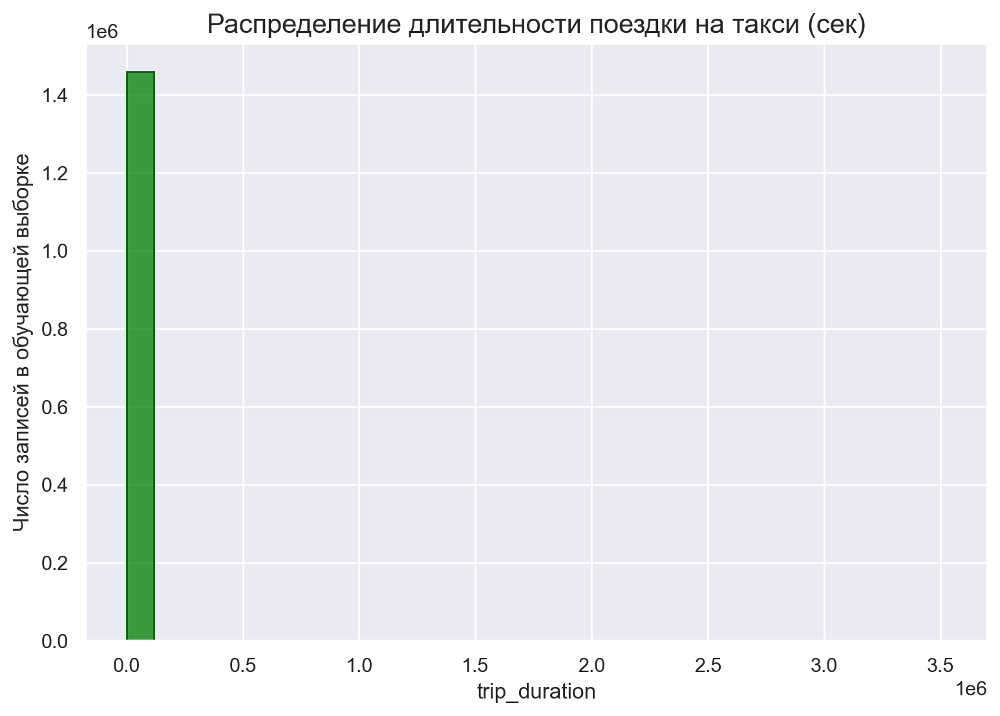

In [9]:
fig, ax = plt.subplots(figsize=(9, 6))
ax.set_title('Распределение длительности поездки на такси (сек)', fontsize=15)
plt.xlabel('trip_duration')
plt.ylabel('Число записей в обучающей выборке')
sns.histplot(train['trip_duration'],
             bins=30,
             ax=ax, 
             color='green',
             edgecolor='darkgreen');

**Вопрос**: Что можно сказать о целевой переменной по гистограмме её значений?

**Ответ**: по гистограмме целевой перменной можно увидеть ее распределение, понять, есть ли в ней выбросы или нетипичные наблюдения. Также можно понять порядок шкалы измерения таргета (масштаб).

В соревновании в качестве метрики качества использовалось RMSLE:
$$\text{RMSLE}(X, y, a) = \sqrt{\frac{1}{\ell}\sum_{i=1}^{\ell} \big(\log{(y_i + 1)} - \log{(a(x_i) + 1)}\big)^2}$$

**Вопрос**: Как вы думаете, почему авторы соревнования выбрали именно RMSLE, а не RMSE?

**Ответ**: мы работаем с секундами. *Во-первых*, с технической точки зрения логичнее и проще предсказывать порядок длительности поездки в секундах, иначе наши метрики и функции потерь будут работать не совсем корректно: по сути, мы всегда будем довольно сильно ошибаться, предсказывая точное число секунд. *Во-вторых*, для потенциальной компании для бизнес-задач важнее точнее предсказать порядок длительности поездки, а не точное число секунд. И, *в-третьих*, данная метрика штрафует за заниженный прогноз больше, чем за завышенный, что актуально для сервисов такси, работающих с клиентами.

На семинаре мы рассматривали несколько моделей линейной регрессии в `sklearn`, но каждая из них оптимизировала среднеквадратичную ошибку (MSE), а не RMSLE. Давайте проделаем следующий трюк: будем предсказывать не целевую переменную, а ее *логарифм*. Обозначим $\hat{y}_i = \log{(y_i + 1)}$ — модифицированный таргет, а $\hat{a}(x_i)$ — предсказание модели, которая обучалась на $\hat{y}_i$, то есть логарифм таргета. Чтобы предсказать исходное значение, мы можем просто взять экспоненту от нашего предсказания: $a(x_i) = \exp(\hat{a}(x_i)) - 1$.

**Вопрос**: Покажите, что оптимизация RMSLE для модели $a$ эквивалентна оптимизации MSE для модели $\hat{a}$.

**Доказательство**: $$\text{RMSLE}(X, y, a) = \sqrt{\frac{1}{\ell}\sum_{i=1}^{\ell} \big(\log{(y_i + 1)} - \log{(a(x_i) + 1)}\big)^2} = \text{RMSE}\big(\log(y_i + 1), \log(a(x_i) + 1)\big) = \\
= \sqrt{\text{MSE}\big(\log(y_i) + 1), \log(a(x_i) + 1\big)} = \sqrt{\frac{1}{\ell}\sum_{i=1}^{\ell} \big(\log{(y_i + 1)} - \log{(a(x_i) + 1)}\big)^2} = \text{RMSLE}\big(\hat{y}_i, \hat{a}(x_i)\big)$$ 

*Комментарий*: это просто преобразование аргументов, т.е. такой же RMSE, рассчитанный в логарифмической шкале. Берем натуральный логарифм от выходов и сраниваем с натуральным логарифмом истинного ответа, возвращаем среднеквадратичное отклонение. Порядок изменяется линейно.

Итак, мы смогли свести задачу оптимизации RMSLE к задаче оптимизации MSE, которую мы умеем решать! Кроме того, у логарифмирования таргета есть еще одно полезное свойство. Чтобы его увидеть, добавьте к нашей выборке колонку `log_trip_duration` (воспользуйтесь `np.log1p`) и нарисуйте гистограмму модифицированного таргета по обучающей выборке. Удалите колонку со старым таргетом.

In [10]:
# добавляем log_trip_duration
train['log_trip_duration'] = np.log1p(train['trip_duration'].values)

# удаляем старые значения таргета
train = train.drop('trip_duration', axis='columns')

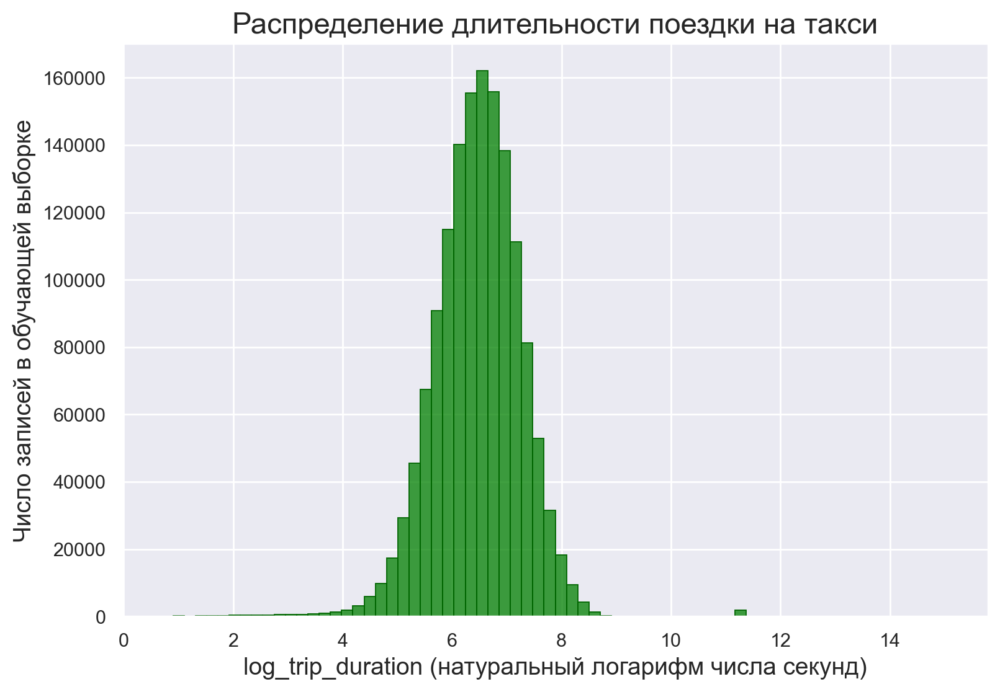

In [11]:
fig, ax = plt.subplots(figsize=(9, 6))
ax.set_title('Распределение длительности поездки на такси', fontsize=17)
plt.xlabel('log_trip_duration (натуральный логарифм числа секунд)', fontsize=14)
plt.ylabel('Число записей в обучающей выборке', fontsize=14)
sns.histplot(train['log_trip_duration'],
             bins=70,
             ax=ax, 
             color='green',
             edgecolor='darkgreen');

In [12]:
# проверим
train.head()

,id,vendor_id,pickup_datetime,passenger_count,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,store_and_fwd_flag,log_trip_duration
0,id2875421,2,2016-03-14 17:24:55,1,-73.982155,40.767937,-73.964630,40.765602,N,6.122493
1,id2377394,1,2016-06-12 00:43:35,1,-73.980415,40.738564,-73.999481,40.731152,N,6.498282
2,id3858529,2,2016-01-19 11:35:24,1,-73.979027,40.763939,-74.005333,40.710087,N,7.661527
3,id3504673,2,2016-04-06 19:32:31,1,-74.010040,40.719971,-74.012268,40.706718,N,6.063785
4,id2181028,2,2016-03-26 13:30:55,1,-73.973053,40.793209,-73.972923,40.782520,N,6.077642


Чтобы иметь некоторую точку отсчета, давайте посчитаем значение метрики при наилучшем константном предсказании:

*Прим.:* логично, что теперь лучший константный прогноз $-$ это средний натуральный логарифм целевой переменной.

In [13]:
# источник: https://www.kaggle.com/code/carlolepelaars/understanding-the-metric-rmsle

best_constant = np.mean(train['log_trip_duration'])
print(f'Лучшая константа: \n{round(best_constant, 2)} (натуральный логарифм), или \
    \n{round(np.expm1(best_constant), 2)} (секунд), \n{round(np.expm1(best_constant) / 60, 2)} (минут)')

Лучшая константа: 
6.47 (натуральный логарифм), или     
642.54 (секунд), 
10.71 (минут)


In [14]:
const_pred = np.ones(train.shape[0]) * best_constant
const_RMSLE = mean_squared_error(const_pred, train['log_trip_duration'], squared=False)  # считаем RMSE, т.к. натуральный логарифм уже взят

print(f'Значение метрики RMSLE на обучающей выборке при наилучшем константном предсказании: {round(const_RMSLE, 5)}')

Значение метрики RMSLE на обучающей выборке при наилучшем константном предсказании: 0.79576


*Бейзлайн получен!*

## Часть 1. Изучаем `pickup_datetime` (2 балла)

**Задание 2 (0.25 баллов)**. Для начала давайте посмотрим, сколько всего было поездок в каждый из дней. Постройте график зависимости количества поездок от дня в году (например, можно воспользоваться `sns.countplot`):

In [15]:
# отсортируем все дни, за которые у нас есть наблюдения
dates = train['pickup_datetime'].dt.date.sort_values().rename("dates")

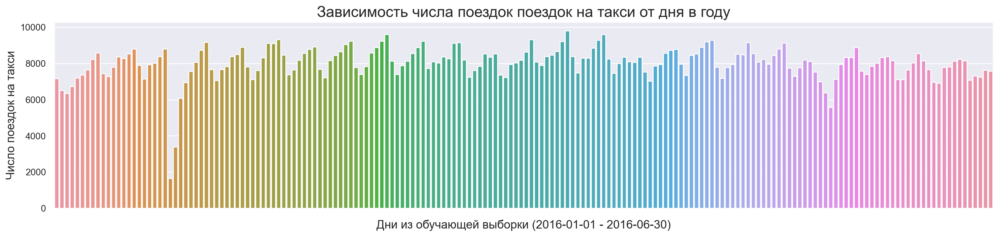

In [16]:
plt.figure(figsize=(20, 4))
dates_plot = sns.countplot(
  x=dates
)
plt.title('Зависимость числа поездок поездок на такси от дня в году', fontsize=18)
plt.ylabel('Число поездок на такси', fontsize=14)
plt.xlabel('Дни из обучающей выборки (2016-01-01 - 2016-06-30)', fontsize=14)
dates_plot.set_xticklabels('');

# при добавлении надписей в виде конкретных дат график сильно портится
# dates_plot.set_xticklabels(dates_plot.get_xticklabels(), rotation=90, fontsize=9);

In [17]:
# посмотрим на самые низкие по числу поездок дни
train.groupby(dates).count()['id'].sort_values().head()

dates
2016-01-23    1648
2016-01-24    3383
2016-05-30    5570
2016-01-25    6084
2016-01-03    6353
Name: id, dtype: int64

**Вопрос**: Вы, вероятно, заметили, что на графике есть 2 периода с аномально маленькими количествами поездок. Вычислите, в какие даты происходили эти скачки вниз и найдите информацию о том, что происходило в эти дни в Нью-Йорке.

**Ответ**: 
* в период 2016.01.23 $-$ 2016.01.25 в Нью-Йорке была *сильная снежная буря*, 2016.01.23 запретили автомобильное движение (https://www.rbc.ru/society/23/01/2016/56a3e5799a79474d3a9a9598); 
* в период 2016.05.29 $-$ 2016.05.30 отмечался День поминовения (*Memorial Day*), в 2016 г. он пришелся на 2016.05.30 $-$ это день памяти погибших американских военнослужащих (https://brightonbeachnews.com/rus/день-поминовения-в-нью-йорке/).

Нарисуйте графики зависимости количества поездок от дня недели и от часов в сутках (воспользуйтесь `sns.relplot`):

*1. Зависимость количества поездок на такси от дня недели:*

In [18]:
# дни и соответствующее им число поездок
number_of_trips_by_day = train.groupby(dates).count()['id']
number_of_trips_by_day.head(3)

dates
2016-01-01    7162
2016-01-02    6512
2016-01-03    6353
Name: id, dtype: int64

In [19]:
df_daily_trips = pd.DataFrame(number_of_trips_by_day.values)                       # создаем массив, добавляем число поездок
df_daily_trips = df_daily_trips.rename(columns={0: "number_of_trips"})

df_daily_trips['day_of_week'] = dates.unique()                                     # добавляем сами даты
df_daily_trips['day_of_week'] = pd.to_datetime(df_daily_trips['day_of_week'])      # меняем дату на нужный формат
df_daily_trips['day_of_week'] = df_daily_trips['day_of_week'].dt.day_of_week       # меняем конкретную дату на день недели

df_daily_trips

,number_of_trips,day_of_week
0,7162,4
1,6512,5
2,6353,6
3,6725,0
4,7204,1
...,...,...
177,7084,6
178,7311,0
179,7253,1
180,7623,2


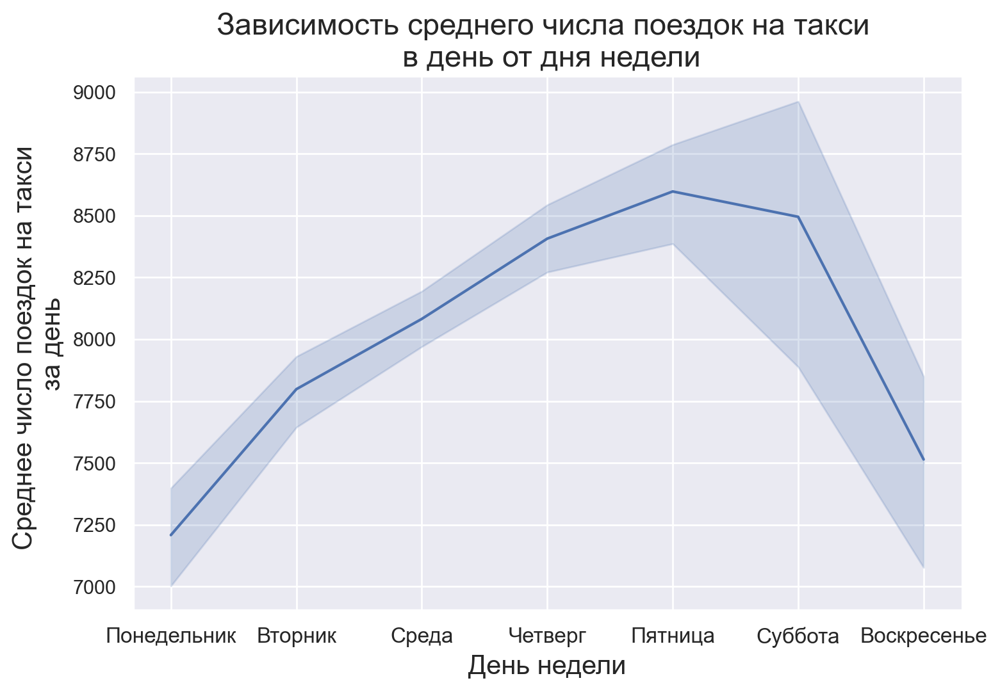

In [20]:
sns.relplot(x='day_of_week',
            y='number_of_trips',
            kind='line',
            height=5,
            aspect=1.5,
            data=df_daily_trips)

plt.title('Зависимость среднего числа поездок на такси \n в день от дня недели', fontsize=17)

plt.xlabel('День недели', fontsize=15)
plt.ylabel('Среднее число поездок на такси \nза день', fontsize=15)
plt.xticks(np.arange(7), labels=['Понедельник', 'Вторник', 'Среда', 'Четверг', 'Пятница', 'Суббота', 'Воскресенье'], fontsize=12);

*2. Зависимость количества поездок на такси от часов в сутках:*

In [21]:
# создадим переменную, отвечающую за час
hours = train['pickup_datetime'].dt.hour.rename('hours')
hours

0          17
1           0
2          11
3          19
4          13
           ..
1458639    13
1458640     7
1458641     6
1458642    15
1458643    14
Name: hours, Length: 1458644, dtype: int64

In [22]:
# группируем массив по дате и по часу
df_trips_by_hour = train.groupby([dates, hours]).count()['id'].to_frame()
df_trips_by_hour = df_trips_by_hour.rename(columns={'id': "number_of_trips"})

df_trips_by_hour

number_of_trips
dates      hours                 
2016-01-01 0                  546
           1                  566
           2                  503
           3                  479
           4                  323
...                           ...
2016-06-30 19                 484
           20                 440
           21                 484
           22                 462
           23                 423

[4359 rows x 1 columns]

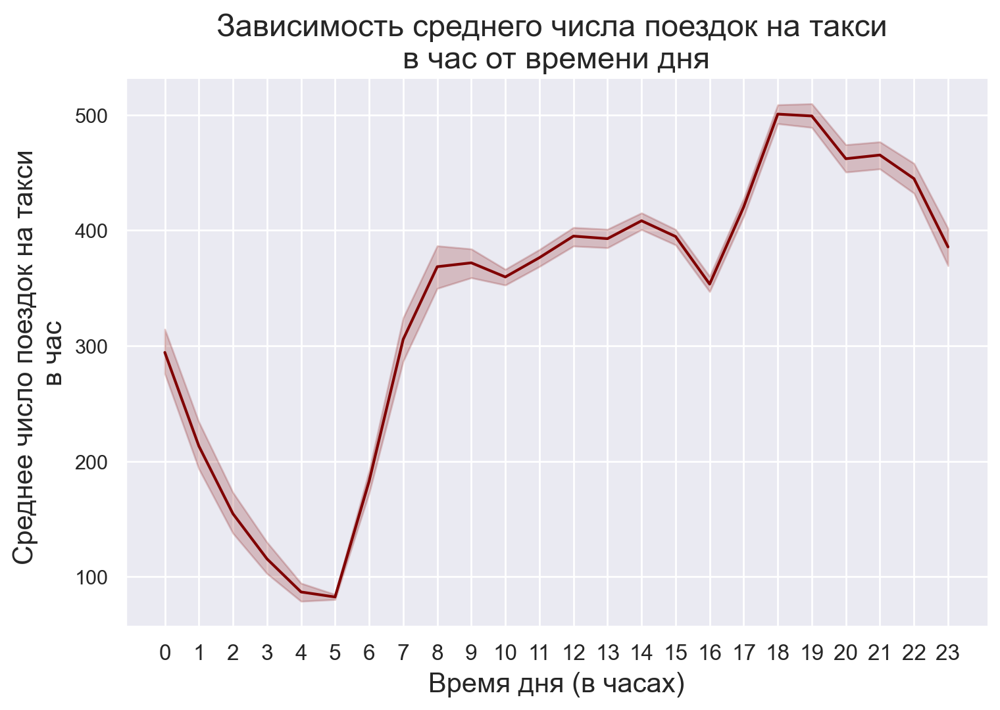

In [23]:
sns.relplot(x='hours',
            y='number_of_trips',
            kind='line',
            height=5,
            aspect=1.5,
            color='Maroon',
            data=df_trips_by_hour)

plt.title('Зависимость среднего числа поездок на такси \nв час от времени дня', fontsize=17)

plt.xlabel('Время дня (в часах)', fontsize=15)
plt.ylabel('Среднее число поездок на такси \nв час', fontsize=15)
plt.xticks(np.arange(24), fontsize=12);

**Задание 3 (0.5 баллов)**. Нарисуйте на одном графике зависимости количества поездок от часа в сутках для разных месяцев (разные кривые, соответствующие разным месяцам, окрашивайте в разные цвета, воспользуйтесь `hue` в `sns.relplot`). Аналогично нарисуйте зависимости количества поездок от часа в сутках для разных дней недели.

*1. Зависимость количества поездок от часа в сутках для разных месяцев:*

In [24]:
plot_data = train.copy()

# создадим колонки с нужной для графиков информацией
plot_data['month_number'] = plot_data['pickup_datetime'].dt.month
plot_data['day_of_week'] = plot_data['pickup_datetime'].dt.day_of_week
plot_data['hour_number'] = plot_data['pickup_datetime'].dt.hour

# удалим лишние колонки, уникального id поездки будет достаточно
plot_data = plot_data.drop(['vendor_id', 'passenger_count', 
                            'pickup_longitude', 'pickup_latitude',
                            'dropoff_longitude', 'dropoff_latitude', 
                            'store_and_fwd_flag', 'log_trip_duration'], 
                            axis='columns')

In [25]:
plot_data.head()

,id,pickup_datetime,month_number,day_of_week,hour_number
0,id2875421,2016-03-14 17:24:55,3,0,17
1,id2377394,2016-06-12 00:43:35,6,6,0
2,id3858529,2016-01-19 11:35:24,1,1,11
3,id3504673,2016-04-06 19:32:31,4,2,19
4,id2181028,2016-03-26 13:30:55,3,5,13


In [26]:
# группируем поездки по месяцу и времени суток
df_month_hours = plot_data.groupby(['month_number', 'hour_number']).count()['id'].to_frame()
df_month_hours = df_month_hours.rename(columns={'id': "number_of_trips"})

# нормируем значения на среднее число дней в каждом месяце по массиву, чтобы получить интерпретируемые значения, а не абстрактные суммы
df_month_hours['number_of_trips'] = df_month_hours['number_of_trips'] / (182 / 6)
df_month_hours

number_of_trips
month_number hour_number                 
1            0                 274.615385
             1                 210.989011
             2                 159.230769
             3                 117.824176
             4                  86.109890
...                                   ...
6            19                467.703297
             20                421.945055
             21                452.967033
             22                441.461538
             23                392.274725

[144 rows x 1 columns]

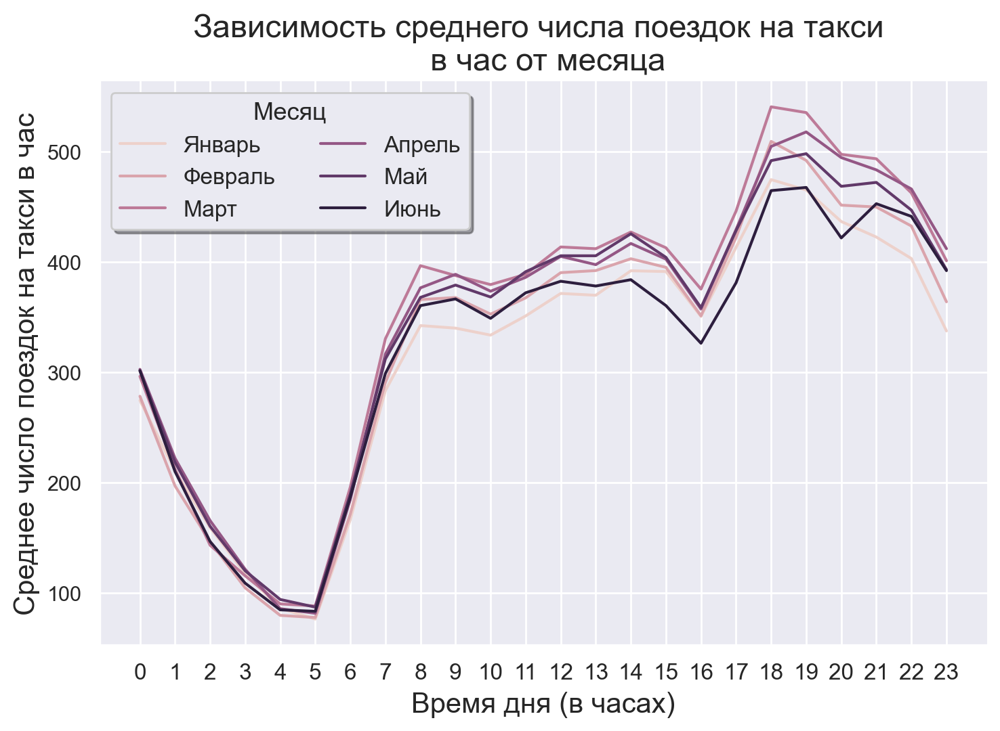

In [27]:
sns.relplot(x='hour_number',
            y='number_of_trips',
            hue='month_number',
            legend=False,
            kind='line',
            height=5,
            aspect=1.5,
            data=df_month_hours)

plt.title('Зависимость среднего числа поездок на такси \n в час от месяца', fontsize=17)

plt.xlabel('Время дня (в часах)', fontsize=15)
plt.ylabel('Среднее число поездок на такси в час', fontsize=15)
plt.xticks(np.arange(24), fontsize=12)
plt.legend(title='Месяц', labels=['Январь', 'Февраль', 'Март', 'Апрель', 'Май', 'Июнь'], title_fontsize=13, fontsize=12, ncol=2, loc='best', shadow=True);

*2. Зависимость количества поездок от часа в сутках для разных дней недели:*

In [28]:
# группируем поездки по дню недели и времени суток
df_days_hours = plot_data.groupby(['day_of_week', 'hour_number']).count()['id'].to_frame()
df_days_hours = df_days_hours.rename(columns={'id': "number_of_trips"})

# нормируем значения на число недель в выборке, чтобы получить интерпретируемые значения, а не абстрактные суммы
df_days_hours['number_of_trips'] = df_days_hours['number_of_trips'] / (182 / 7)
df_days_hours

number_of_trips
day_of_week hour_number                 
0           0                 165.346154
            1                  99.153846
            2                  63.769231
            3                  47.153846
            4                  51.961538
...                                  ...
6           19                386.384615
            20                351.384615
            21                336.038462
            22                303.538462
            23                244.884615

[168 rows x 1 columns]

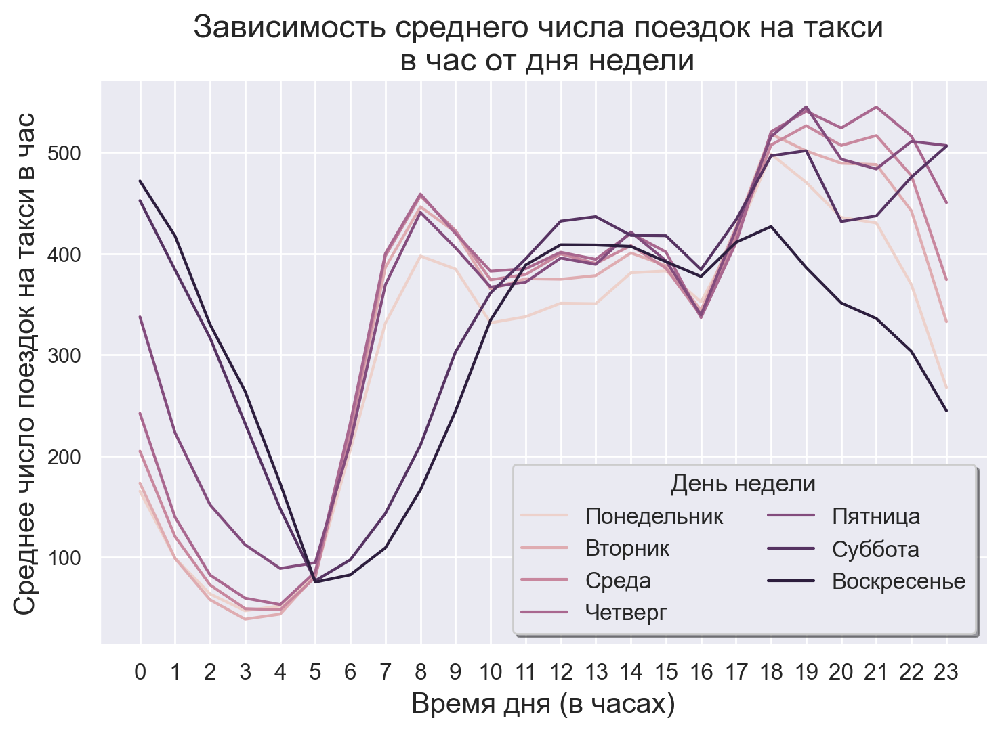

In [29]:
sns.relplot(x='hour_number',
            y='number_of_trips',
            hue='day_of_week',
            legend=False,
            kind='line',
            height=5,
            aspect=1.5,
            data=df_days_hours)

plt.title('Зависимость среднего числа поездок на такси \n в час от дня недели', fontsize=17)

plt.xlabel('Время дня (в часах)', fontsize=15)
plt.ylabel('Среднее число поездок на такси в час', fontsize=15)
plt.xticks(np.arange(24), fontsize=12)
plt.legend(title='День недели', labels=['Понедельник', 'Вторник', 'Среда', 'Четверг', 'Пятница', 'Суббота', 'Воскресенье'], title_fontsize=13, fontsize=12, 
            ncol=2, loc='best', shadow=True);

**Вопрос**: Какие выводы можно сделать, основываясь на графиках выше? Выделяются ли какие-нибудь дни недели? Месяца? Время суток? С чем это связано?

**Ответ:** Можно выделить **особо явные паттерны**:
* в среднем от понедельника до пятницы наблюдается *рост числа поездок*, затем - от пятницы до воскресенья - *падение среднего числа поездок*
    * при этом наименьшее число поездок в среднем наблюдается в понедельник (около **7250**), наибольшее - в пятницу (около **8600**)
* говоря о *точном времени суток*:
    * в среднем от 5 до 8 часов утра наблюдается сильный рост числа поездок
    * с 8 утра до 16 часов дня наблюдается некоторое плато (с просадкой в 16 часов)
    * с 16 до 19/20 часов вечера наблюдается активный рост среднего числа поездок
    * с 19 вечера до 5 утра наблюдается планомерное снижение числа поездок в среднем
* в *будние дни* больше загруженности приходится на рабочее время (это логично): есть явные пики в 8 утра, 18-21 часов вечера; а в *выходные дни* - в обед (12-13 часов дня) и ближе к позднему вечеру (в субботу более явно, вероятно, часть людей еще работает)
    * при этом *ночное время* (с 0 до 5) на выходных нагрузка гораздо больше - наверное люди возвращаются с хорошего отдыха :)

И **менее явные паттерны**:
* в среднем больше всего поездок в *марте*, а в *январе и июне* (кажется) - меньше всего
    * вероятно, это время самой большой деловой занятости и время отпусков соответственно
    * в целом кажется, что востребованность такси весной сильнее, чем в другие имеющиеся месяцы
* в *январе* вечернее снижение спроса начинается раньше (с 17 часов), чем в другие месяцы; возможно это связано с праздниками, отпусками, погодой или тем, что рабочий день заканчивается раньше

**Задание 4 (0.5 баллов)**. Разбейте выборку на обучающую и тестовую в отношении 7:3. По обучающей выборке нарисуйте график зависимости среднего логарифма времени поездки от дня недели. Затем сделайте то же самое, но для часа в сутках и дня в году.

In [30]:
X_train, X_test = train_test_split(train, train_size=0.7, test_size=0.3, random_state=13)

*1. График зависимости среднего логарифма времени поездки от дня недели:*

In [31]:
plot_df = X_train.copy()                                                                                # копируем массив данных для визуализации
dates_train = plot_df['pickup_datetime'].dt.date.sort_values().rename("dates_train")                    # сортируем имеющиеся дни

log_trip_duration_by_day = plot_df.groupby(dates_train).mean()['log_trip_duration']                     # получаем средний логарифм длительности поездки по дням

df_log_trip_duration_daily = pd.DataFrame(log_trip_duration_by_day.values)                              # создаем массив, добавляем средний логарифм по дням
df_log_trip_duration_daily = df_log_trip_duration_daily.rename(columns={0: "log_trip_duration"})

df_log_trip_duration_daily['day_of_week'] = dates_train.unique()                                        # добавляем сами даты
df_log_trip_duration_daily['day_of_week'] = pd.to_datetime(df_log_trip_duration_daily['day_of_week'])   # меняем дату на нужный формат
df_log_trip_duration_daily['day_of_week'] = df_log_trip_duration_daily['day_of_week'].dt.day_of_week    # меняем конкретную дату на день недели

df_log_trip_duration_daily

,log_trip_duration,day_of_week
0,6.348797,4
1,6.323614,5
2,6.317136,6
3,6.310616,0
4,6.364996,1
...,...,...
177,6.445320,6
178,6.464930,0
179,6.499612,1
180,6.536172,2


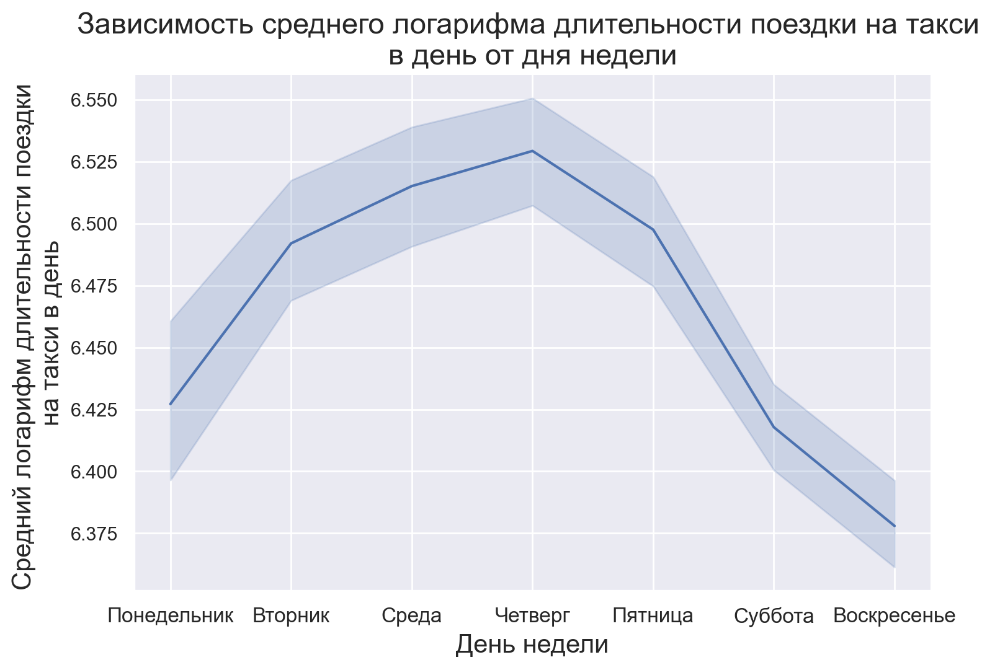

In [32]:
sns.relplot(x='day_of_week',
            y='log_trip_duration',
            legend=False,
            kind='line',
            height=5,
            aspect=1.5,
            data=df_log_trip_duration_daily)

plt.title('Зависимость среднего логарифма длительности поездки на такси \nв день от дня недели', fontsize=17)

plt.xlabel('День недели', fontsize=15)
plt.ylabel('Cредний логарифм длительности поездки \nна такси в день', fontsize=15)
plt.xticks(np.arange(7), labels=['Понедельник', 'Вторник', 'Среда', 'Четверг', 'Пятница', 'Суббота', 'Воскресенье'], fontsize=12);

*2. График зависимости среднего логарифма времени поездки от часа в сутках:*

In [33]:
hours_train = plot_df['pickup_datetime'].dt.hour.rename('hours_train')                                              # создаем переменную с часами доступных поездок
df_log_trip_duration_by_hour = plot_df.groupby([dates_train, hours_train]).mean()['log_trip_duration'].to_frame()   # группируем по дате и времени, 
                                                                                                                    # считаем среднее по каждому часу
df_log_trip_duration_by_hour

log_trip_duration
dates_train hours_train                   
2016-01-01  0                     6.502075
            1                     6.551099
            2                     6.463131
            3                     6.433034
            4                     6.513731
...                                    ...
2016-06-30  19                    6.513091
            20                    6.464148
            21                    6.483103
            22                    6.605399
            23                    6.603483

[4359 rows x 1 columns]

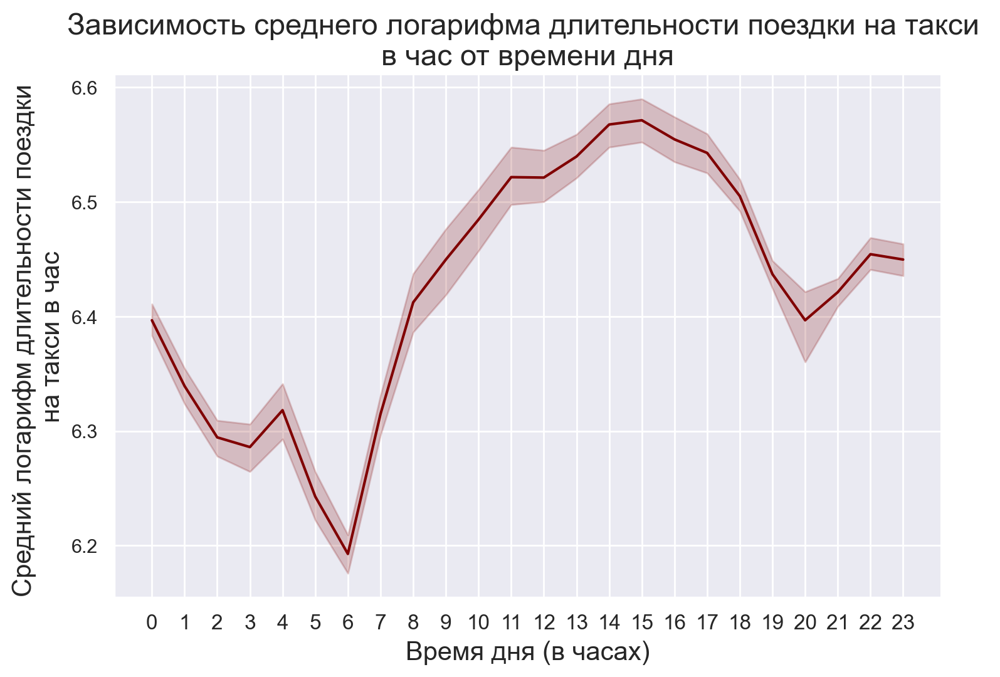

In [34]:
sns.relplot(x='hours_train',
            y='log_trip_duration',
            kind='line',
            height=5,
            aspect=1.5,
            color='Maroon',
            data=df_log_trip_duration_by_hour)

plt.title('Зависимость среднего логарифма длительности поездки на такси \nв час от времени дня', fontsize=17)

plt.xlabel('Время дня (в часах)', fontsize=15)
plt.ylabel('Cредний логарифм длительности поездки \nна такси в час', fontsize=15)
plt.xticks(np.arange(24), fontsize=12);

*3. График зависимости среднего логарифма времени поездки от дня в году:*

In [35]:
df_log_trip_duration_by_day = plot_df.groupby(dates_train).mean()['log_trip_duration'].to_frame()  # группируем по дням, получаем среднее значение за каждый день
df_log_trip_duration_by_day

,log_trip_duration
dates_train,
2016-01-01,6.348797
2016-01-02,6.323614
2016-01-03,6.317136
2016-01-04,6.310616
2016-01-05,6.364996
...,...
2016-06-26,6.445320
2016-06-27,6.464930
2016-06-28,6.499612


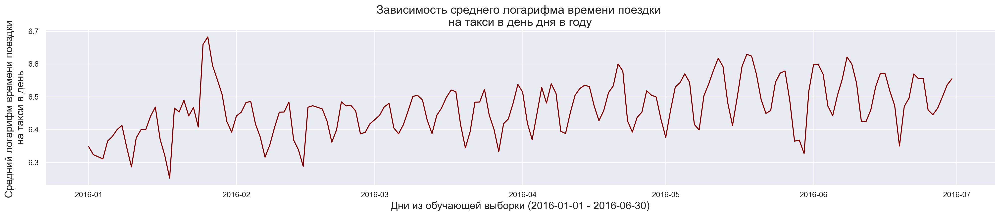

In [36]:
graph = sns.relplot(x='dates_train',
            y='log_trip_duration',
            kind='line',
            height=4,
            aspect=5,
            color='Maroon',
            data=df_log_trip_duration_by_day)

plt.title('Зависимость среднего логарифма времени поездки \nна такси в день дня в году', fontsize=17)

plt.xlabel('Дни из обучающей выборки (2016-01-01 - 2016-06-30)', fontsize=15)
plt.ylabel('Cредний логарифм времени поездки \nна такси в день', fontsize=15);

# можно вставить уникальные даты, но будет громоздко
# plt.xticks(dates_train.unique(), fontsize=9, rotation=90);  

In [37]:
# посмотрим на даты с самыми короткими средними поездками
df_log_trip_duration_by_day.sort_values('log_trip_duration').head(10)

,log_trip_duration
dates_train,
2016-01-18,6.252016
2016-01-10,6.286159
2016-02-15,6.288113
2016-01-04,6.310616
2016-02-07,6.315837
2016-01-03,6.317136
2016-01-17,6.320052
2016-01-02,6.323614
2016-05-30,6.327142


In [38]:
# посмотрим на даты с самыми длинными средними поездками
df_log_trip_duration_by_day.sort_values('log_trip_duration').tail()

,log_trip_duration
dates_train,
2016-06-08,6.620999
2016-05-19,6.623901
2016-05-18,6.629508
2016-01-25,6.659592
2016-01-26,6.682237


**Вопрос**: Похожи ли графики зависимости таргета от дня недели и от часа в сутках на аналогичные графики для количества поездок? Почему? Что происходит со средним таргетом в те два аномальных периода, что мы видели выше? Почему так происходит? Наблюдаете ли вы какой-нибудь тренд на графике зависимости `log_trip_duration` от номера дня в году?

**Ответ:** 
* тренд зависимости среднего логарифма длительности поездки от дня недели, в целом, похож, на аналогичную зависимость по числу поездок, но только теперь пик (самые длительные поездки) приходится на четверг, а не на пятницу
* если говорить о связи средней длительности поездки и среднего количества поездок, здесь паттерны не сильно похожи:
    * в средней длительности поездок есть неожиданный подъем в 4 утра (возможно, это ранние поездки в аэропорт)
    * до 8 утра оба тренда ведут себя одинаково: рост числа поездок и их длительности
    * число поездок с 8 утра до 16 часов примерно одинаковое, но вот их продолжительность планомерно увеличивается до глобального пика в 14-15 часов (вероятно, это связанно с пробками в час-пик)
    * в вечернее время среднее число поездок и их средняя продолжительность ведут себя противоположно. Возможно, рост длительности средних поездок ближе к ночи (с 20 до 23) связан с тем, что многие люди едут в аэропорт на вечерние и ночные рейсы 
* про аномальные периоды:
    * в период снежной бури в конце января 2016 г., когда число поездок радикально снизилось, их средняя продолжительность, наоборот, максимальная за все доступное время - это логично, ведь, вероятно, были большие пробки и перекрытия дорог
    * в период Дня поминовения в конце мая 2016 г., наоборот, средняя продолжительность поездок сильно уменьшилась; возможно, вместо того, чтобы ездить на работу, люди ездили в соседний парк, чтобы увидеться с семьей
* в целом, на графике зависимости `log_trip_duration` от номера дня в году наблюдается следующий тренд: планомерное увеличение средней продолжительности поездок от одной недели к другой неделе, несмотря на цикличность, связанную с днем недели. Однако можно предположить, что, начиная с июня, средняя продолжительность поездок начинает несколько снижаться (как и число поездок в целом): возможно, это связано с периодом отпусков. Однако линейная связь прослеживается.

Добавьте следующие признаки на основе `pickup_datetime`:
1. День недели
2. Месяц
3. Час
4. Является ли период аномальным (два бинарных признака, соответствующие двум аномальным периодам)
5. Номер дня в году

Я решил отнести к аномальным периодам следующие дни:
1. **23, 24 и 25 января**
2. **28, 29, 30 мая**

Выбор был сделан, основываясь на числе поездок в эти дни и среднем значении логарифма длительности поездок.

In [39]:
abnormal_days = {
    "jan": set([25, 26, 27]),
    "may": set([149, 150, 151])
}

In [40]:
# создаем новые признаки
train['day_of_week'] = train['pickup_datetime'].dt.day_of_week
train['month_number'] = train['pickup_datetime'].dt.month
train['hour_number'] = train['pickup_datetime'].dt.hour
train['day_of_year'] = train['pickup_datetime'].dt.day_of_year

# аномальные периоды
train['abnormal_jan'] = 0
train['abnormal_may'] = 0

# ставим флаг, если аномальный период
train.loc[train['day_of_year'].isin(abnormal_days['jan']), 'abnormal_jan'] += 1
train.loc[train['day_of_year'].isin(abnormal_days['may']), 'abnormal_may'] += 1

In [41]:
train.head()

,id,vendor_id,pickup_datetime,passenger_count,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,store_and_fwd_flag,log_trip_duration,day_of_week,month_number,hour_number,day_of_year,abnormal_jan,abnormal_may
0,id2875421,2,2016-03-14 17:24:55,1,-73.982155,40.767937,-73.964630,40.765602,N,6.122493,0,3,17,74,0,0
1,id2377394,1,2016-06-12 00:43:35,1,-73.980415,40.738564,-73.999481,40.731152,N,6.498282,6,6,0,164,0,0
2,id3858529,2,2016-01-19 11:35:24,1,-73.979027,40.763939,-74.005333,40.710087,N,7.661527,1,1,11,19,0,0
3,id3504673,2,2016-04-06 19:32:31,1,-74.010040,40.719971,-74.012268,40.706718,N,6.063785,2,4,19,97,0,0
4,id2181028,2,2016-03-26 13:30:55,1,-73.973053,40.793209,-73.972923,40.782520,N,6.077642,5,3,13,86,0,0


Итак, мы уже создали некоторое количество признаков.

**Вопрос**: Какие из признаков стоит рассматривать как категориальные, а какие - как численные? Почему?

**Ответ**:
* признаки `abnormal_jan`, `abnormal_may`, `day_of_week`, `month_number`, `hour_number` стоит рассматривать как **категориальные**, поскольку их значения (январь или февраль, 12:00 или 15:00, понедельник или вторник) можно проверить только на равенство и нельзя на другие численные операции $-$ вычитание, сложение, сравнение на больше/меньше и т.д.
* признак `day_of_year` стоит рассматривать как численный, т.к., как было отмеченно ранее, с течением года наблюдается некоторый общий тренд на увеличение длительности поездки; предполагается некоторая линейная связь.

**Задание 5 (0.75 баллов)**. Обучите `Ridge`-регрессию с параметрами по умолчанию, закодировав все категориальные признаки с помощью `OneHotEncoder`. Численные признаки отмасштабируйте с помощью `StandardScaler`. Используйте только признаки, которые мы выделили в этой части задания.

*Разделим массив на признаки и целевую перменную. До этого для визуализации и создания новых признаков было удобнее держать их в одном массиве.*

In [42]:
X_train, X_test = train_test_split(train, train_size=0.7, test_size=0.3, random_state=13)

y_train = X_train['log_trip_duration']
y_test = X_test['log_trip_duration']

X_train = X_train.drop('log_trip_duration', axis='columns')
X_test = X_test.drop('log_trip_duration', axis='columns')

In [43]:
X_days_and_time_train = X_train[['abnormal_jan', 'abnormal_may', 'day_of_week', 'month_number', 'hour_number', 'day_of_year']]
X_days_and_time_test = X_test[['abnormal_jan', 'abnormal_may', 'day_of_week', 'month_number', 'hour_number', 'day_of_year']]

In [44]:
X_days_and_time_train

,abnormal_jan,abnormal_may,day_of_week,month_number,hour_number,day_of_year
502213,0,0,6,6,9,178
505504,0,0,6,6,23,178
381784,0,0,4,2,9,43
835757,0,0,2,3,18,76
1391835,0,0,3,4,19,105
...,...,...,...,...,...,...
1392611,0,0,4,4,23,99
1216442,0,0,2,5,21,132
256742,0,0,2,4,23,97
253456,0,0,0,3,10,74


In [45]:
ohe = OneHotEncoder(sparse=False)

X_days_and_time_train_trans_0 = ohe.fit_transform(X_days_and_time_train[['abnormal_jan', 'abnormal_may', 'day_of_week', 'month_number', 'hour_number']])
X_days_and_time_test_trans_0 = ohe.transform(X_days_and_time_test[['abnormal_jan', 'abnormal_may', 'day_of_week', 'month_number', 'hour_number']])

scaler = StandardScaler()

X_days_and_time_train_trans_1 = scaler.fit_transform(X_days_and_time_train[['day_of_year']])
X_days_and_time_test_trans_1 = scaler.transform(X_days_and_time_test[['day_of_year']])

In [46]:
X_days_and_time_train_trans = np.concatenate((X_days_and_time_train_trans_0, X_days_and_time_train_trans_1), axis=1)
X_days_and_time_test_trans = np.concatenate((X_days_and_time_test_trans_0, X_days_and_time_test_trans_1), axis=1)

In [47]:
X_days_and_time_train_trans.shape, X_days_and_time_test_trans.shape

((1021050, 42), (437594, 42))

In [48]:
model = Ridge(random_state=13)

model.fit(X_days_and_time_train_trans, y_train)
pred_test = model.predict(X_days_and_time_test_trans)
pred_train = model.predict(X_days_and_time_train_trans)

rmse_test = mean_squared_error(pred_test, y_test, squared=False)
rmse_train = mean_squared_error(pred_train, y_train, squared=False)

print(f'RMSLE на тесте: {round(rmse_test, 4)}, \nRMSLE на трейне: {round(rmse_train, 4)}')

RMSLE на тесте: 0.7876, 
RMSLE на трейне: 0.7887


Напомню, **baseline** с константным предсказанием был равен $0.7958$.

## Часть 2. Изучаем координаты (3 балла)
Мы уже очень хорошо изучили данные о времени начала поездки, давайте теперь посмотрим на информацию о координатах начала и конца поездки. Мы подготовили для вас функцию, которая на карте рисует точки начала или конца поездки. Примеры ее вызова вы найдете ниже. Обратите внимание, что в эту функцию мы передаем лишь небольшой кусочек данных, посколько иначе функция будет работать очень долго

In [49]:
# прим.: я добавил размер радиус, оставив тот, который предлагался, по умолчанию
# по моему мнению, предложенный радиус иногда слишком большой
def show_circles_on_map(data, latitude_column, longitude_column, color, radius=100):
    """
    The function draws map with circles on it.
    The center of the map is the mean of coordinates passed in data.
    
    data: DataFrame that contains columns latitude_column and longitude_column
    latitude_column: string, the name of column for latitude coordinates
    longitude_column: string, the name of column for longitude coordinates
    color: string, the color of circles to be drawn
    """

    location = (data[latitude_column].mean(), data[longitude_column].mean())
    m = folium.Map(location=location)

    for _, row in data.iterrows():
        folium.Circle(
            radius=radius,
            location=(row[latitude_column], row[longitude_column]),
            color=color,
            fill_color=color,
            fill=True
        ).add_to(m)

    return m

In [55]:
show_circles_on_map(X_train.sample(10000), "pickup_latitude", "pickup_longitude", "blue")

In [56]:
show_circles_on_map(X_train.sample(1000), "dropoff_latitude", "dropoff_longitude", "blue", radius=10)

**Вопрос**: Какие две точки выделяются на карте?

**Ответ**: (кроме Манхэттена) явно выделяются два аэропорта: Ла-Гуардия и Международный аэропорт имени Джона Кеннеди.

**Задание 6 (0.75 балл)**. Как мы все прекрасно помним, $t = s / v_{\text{ср}}$, поэтому очевидно, что самым сильным признаком будет расстояние, которое необходимо проехать. Мы не можем посчитать точное расстояние, которое необходимо преодолеть такси, но мы можем его оценить, посчитав кратчайшее расстояние между точками начала и конца поездки. Чтобы корректно посчитать расстояние между двумя точками на Земле, можно использовать функцию `haversine`. Также можно воспользоваться кодом с первого семинара. Посчитайте кратчайшее расстояние для объектов и запишите его в колонку `haversine`:

In [50]:
# функция из 1 семинара
def haversine_array(lat1, lng1, lat2, lng2):
    lat1, lng1, lat2, lng2 = map(np.radians, (lat1, lng1, lat2, lng2))
    AVG_EARTH_RADIUS = 6371  # in km
    lat = lat2 - lat1
    lng = lng2 - lng1
    d = np.sin(lat * 0.5) ** 2 + np.cos(lat1) * np.cos(lat2) * np.sin(lng * 0.5) ** 2
    h = 2 * AVG_EARTH_RADIUS * np.arcsin(np.sqrt(d))
    return h

In [51]:
# для всей выборки
train.loc[:, 'haversine'] = haversine_array(train['pickup_latitude'].values, train['pickup_longitude'].values, \
    train['dropoff_latitude'].values, train['dropoff_longitude'].values)

# для обучающей выборки
X_train.loc[:, 'haversine'] = haversine_array(X_train['pickup_latitude'].values, X_train['pickup_longitude'].values, \
    X_train['dropoff_latitude'].values, X_train['dropoff_longitude'].values)

In [52]:
X_train.head()

,id,vendor_id,pickup_datetime,passenger_count,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,store_and_fwd_flag,day_of_week,month_number,hour_number,day_of_year,abnormal_jan,abnormal_may,haversine
502213,id1615460,2,2016-06-26 09:27:45,2,-74.013710,40.645393,-73.989510,40.669369,N,6,6,9,178,0,0,3.357771
505504,id3415975,1,2016-06-26 23:48:52,1,-74.007042,40.704967,-73.978287,40.728909,N,6,6,23,178,0,0,3.600011
381784,id2966434,2,2016-02-12 09:23:18,1,-73.958771,40.777939,-73.980530,40.770168,N,4,2,9,43,0,0,2.025772
835757,id1640176,2,2016-03-16 18:20:37,1,-73.970787,40.761066,-73.960129,40.775440,N,2,3,18,76,0,0,1.833080
1391835,id2659223,1,2016-04-14 19:57:43,2,-73.987328,40.760590,-74.007675,40.740807,N,3,4,19,105,0,0,2.788696


Так как мы предсказываем логарифм времени поездки и хотим, чтобы наши признаки были линейно зависимы с этой целевой переменной, нам нужно логарифмировать расстояние: $\log t = \log s - \log{v_{\text{ср}}}$. Запишите логарифм `haversine` в отдельную колонку:

In [53]:
train['log_haversine'] = np.log1p(train['haversine'].values)

Убедимся, что логарифм расстояния лучше коррелирует с нашим таргетом, чем просто расстояние:

In [54]:
plot_data = train[['haversine', 'log_haversine', 'log_trip_duration']]

*В начале просто посмотрим на совместное распределение таргета с расстоянием и логарифмом расстояния:*

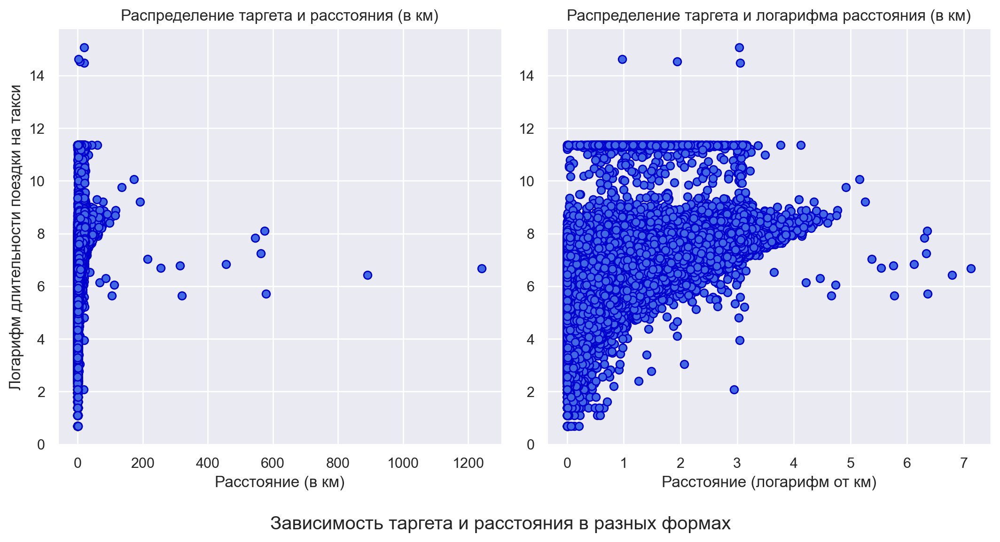

In [55]:
f, (ax0, ax1) = plt.subplots(1, 2, figsize=(12,6.5))

ax0.scatter(x='haversine', y='log_trip_duration', data=plot_data, c='royalblue', edgecolors='mediumblue')
ax0.set_ylabel('Логарифм длительности поездки на такси')
ax0.set_xlabel('Расстояние (в км)')
ax0.set_title('Распределение таргета и расстояния (в км)')

ax1.scatter(x='log_haversine', y='log_trip_duration', data=plot_data, c='royalblue', edgecolors='mediumblue')
ax1.set_ylabel('')
ax1.set_xlabel('Расстояние (логарифм от км)')
ax1.set_title('Распределение таргета и логарифма расстояния (в км)')

f.suptitle("Зависимость таргета и расстояния в разных формах", y=0.035)
f.tight_layout(rect=[0.05, 0.05, 0.95, 0.95])

*Далее попробуем наложить регрессионную линию для наглядности:*

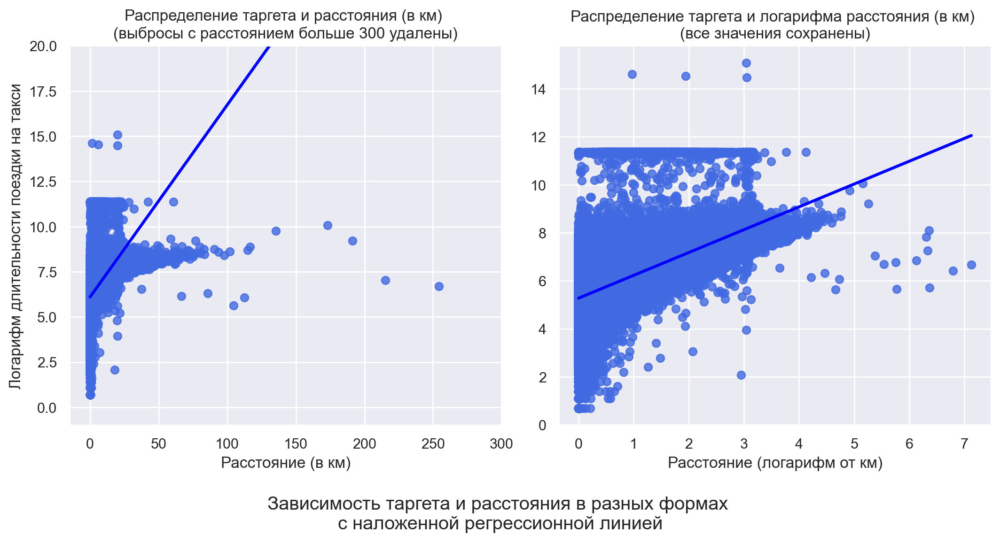

In [63]:
# идея для кода: https://stackoverflow.com/questions/38082602/plotting-multiple-different-plots-in-one-figure-using-seaborn

fig, axs = plt.subplots(ncols=2, figsize=(12,6.5))

sns.regplot(x='haversine', y='log_trip_duration', data=plot_data, ax=axs[0], n_boot=1, scatter_kws={"color": "royalblue"}, line_kws={"color": "blue"})
axs[0].set_ylim(-1, 20)
axs[0].set_xlim(-15, 300)
axs[0].set_ylabel('Логарифм длительности поездки на такси')
axs[0].set_xlabel('Расстояние (в км)')
axs[0].set_title('Распределение таргета и расстояния (в км) \n(выбросы с расстоянием больше 300 удалены)')

sns.regplot(x='log_haversine', y='log_trip_duration', data=plot_data, ax=axs[1], n_boot=1, scatter_kws={"color": "royalblue"}, line_kws={"color": "blue"})
axs[1].set_ylabel('')
axs[1].set_xlabel('Расстояние (логарифм от км)')
axs[1].set_title('Распределение таргета и логарифма расстояния (в км) \n(все значения сохранены)')

fig.suptitle("Зависимость таргета и расстояния в разных формах \nс наложенной регрессионной линией", y=0.035)
fig.tight_layout(rect=[0.05, 0.05, 0.95, 0.95])

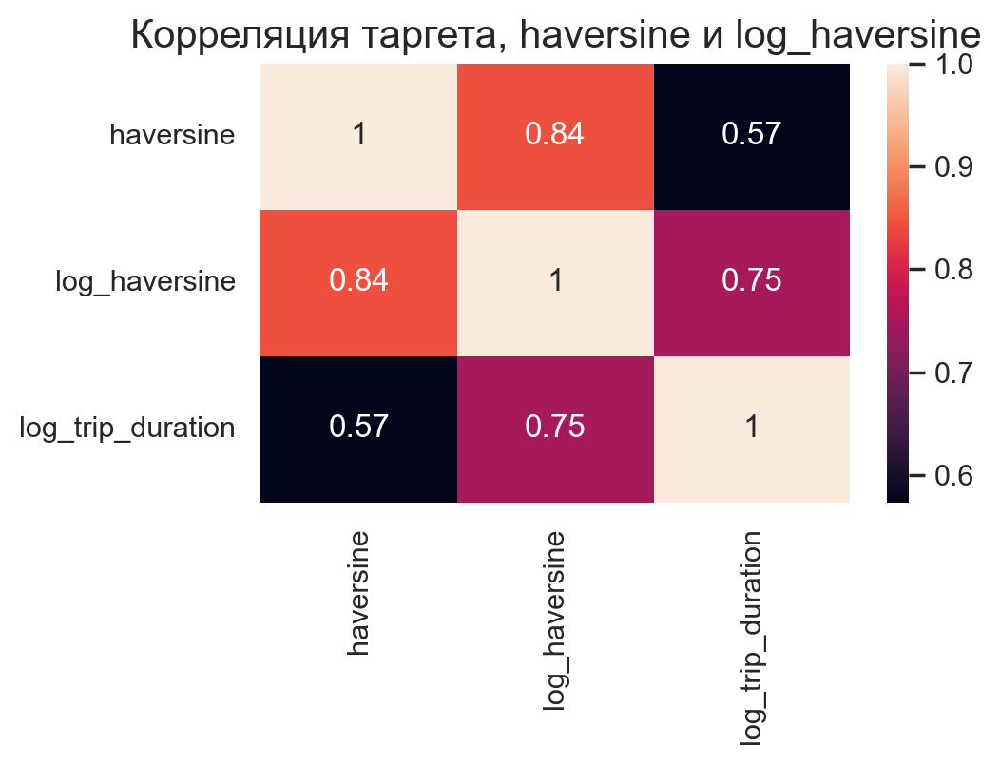

In [56]:
fig, ax = plt.subplots(figsize=(5, 3))
ax = sns.heatmap(data=plot_data.corr(), ax=ax, annot=True)
ax.set_title('Корреляция таргета, haversine и log_haversine', fontsize=15);

*Комментарий*: во-первых, во втором случае (`log_haversine`) прослеживается более сильная линейная взаимосвязь (0.75 против 0.57), а, во-вторых, при использовании обычного `haversine` заметны явные выбросы, которые будут влиять на результат. Взятие логарифма нивеллирует это.

Если не накладывать ограничение на ось Х на графике с регрессионной прямой, будет видно, что есть совершенно нехарактерные значения с типичным временем, но значением расстояния больше 500 км.

**Задание 7 (0.75 балла)**. Давайте изучим среднюю скорость движения такси. Посчитайте среднюю скорость для каждого объекта обучающей выборки, разделив `haversine` на `trip_duration`, и нарисуйте гистограмму ее распределения

In [57]:
X_train['mean_speed'] = X_train['haversine'] / (np.expm1(y_train) / (60 * 60))
X_train['mean_speed']

502213     18.712035
505504     16.301937
381784     13.116510
835757     15.978418
1391835    12.740235
             ...    
1392611     9.602919
1216442    17.448545
256742     13.358892
253456      7.638849
1015882    10.538328
Name: mean_speed, Length: 1021050, dtype: float64

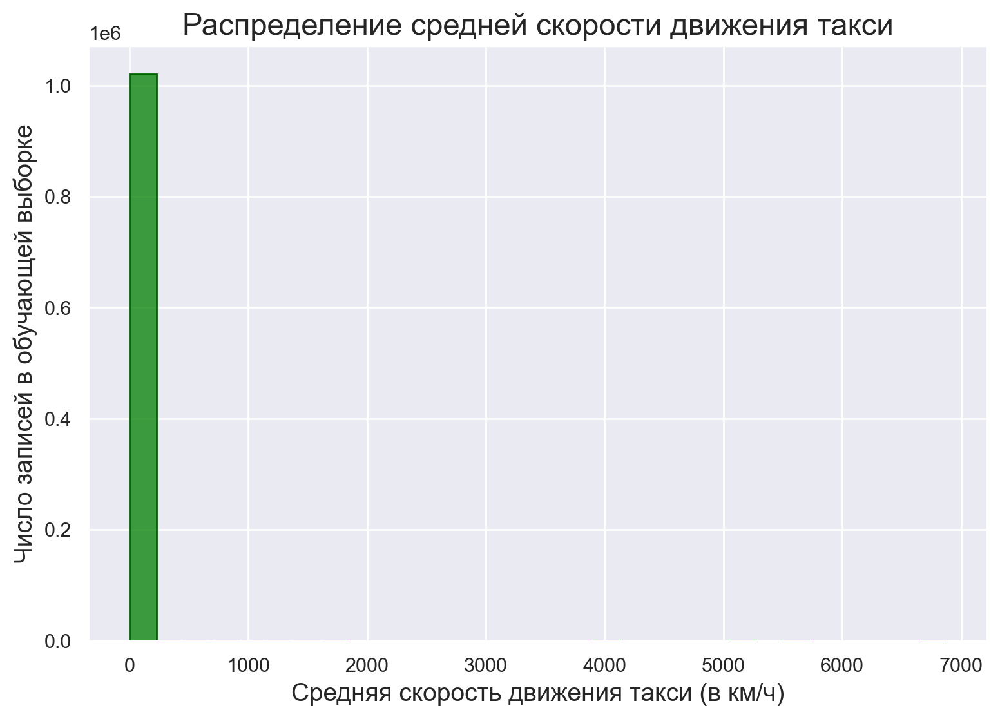

In [58]:
fig, ax = plt.subplots(figsize=(9, 6))
ax.set_title('Распределение средней скорости движения такси', fontsize=17)
plt.xlabel('Средняя скорость движения такси (в км/ч)', fontsize=14)
plt.ylabel('Число записей в обучающей выборке', fontsize=14)
sns.histplot(X_train['mean_speed'],
             bins=30,
             ax=ax, 
             color='green',
             edgecolor='darkgreen');

Как можно видеть по гистограмме, для некоторых объектов у нас получились очень больше значения скоростей. Нарисуйте гистограмму по объектам, для которых значение скорости получилось разумным (например, можно не включать рассмотрение объекты, где скорость больше некоторой квантили):

In [59]:
speed_quant = np.quantile(X_train["mean_speed"], q=0.999)

print(f'Квантиль уровня 0.999: {speed_quant}')

Квантиль уровня 0.999: 54.25953905257128


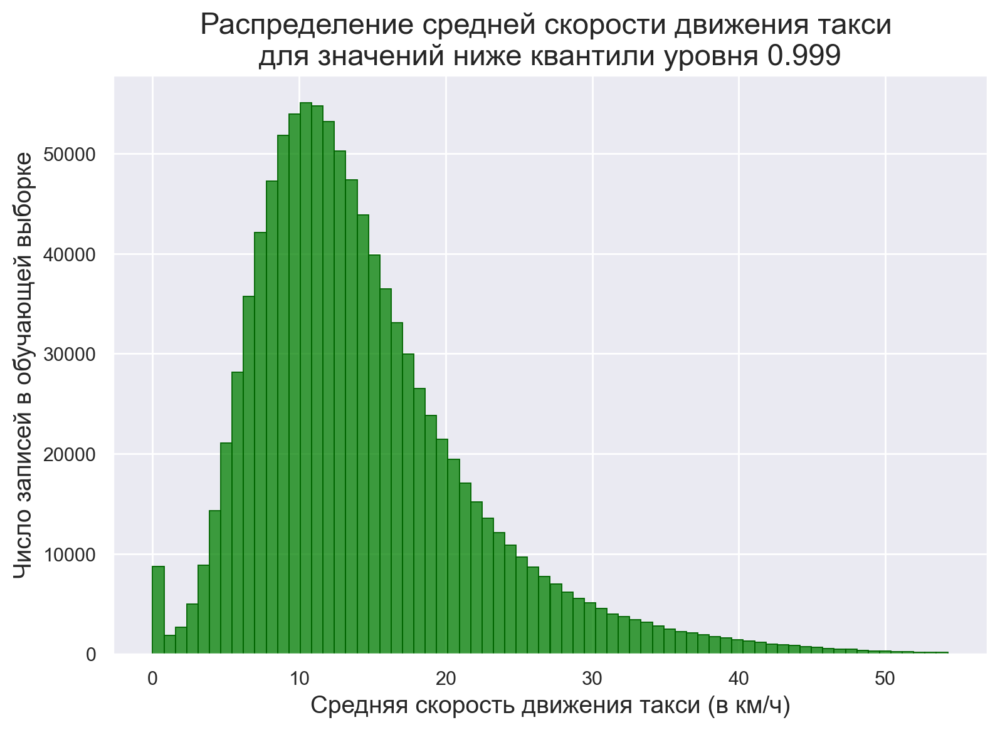

In [60]:
fig, ax = plt.subplots(figsize=(9, 6))
ax.set_title('Распределение средней скорости движения такси \nдля значений ниже квантили уровня 0.999', fontsize=17)
plt.xlabel('Средняя скорость движения такси (в км/ч)', fontsize=14)
plt.ylabel('Число записей в обучающей выборке', fontsize=14)
sns.histplot(X_train['mean_speed'].loc[X_train['mean_speed'] < speed_quant],
             bins=70,
             ax=ax, 
             color='green',
             edgecolor='darkgreen');

Для каждой пары (день недели, час суток) посчитайте медиану скоростей. Нарисуйте с помощью `sns.heatmap` график, где по осям будут дни недели и часы, а в качестве значения функции - медиана скорости

In [61]:
df_speed_cor = X_train.groupby(['day_of_week', 'hour_number']).median()['mean_speed'].to_frame()

mon = df_speed_cor.loc[(0, )].to_numpy().squeeze()
tue = df_speed_cor.loc[(1, )].to_numpy().squeeze()
wed = df_speed_cor.loc[(2, )].to_numpy().squeeze()
thu = df_speed_cor.loc[(3, )].to_numpy().squeeze()
fri = df_speed_cor.loc[(4, )].to_numpy().squeeze()
sat = df_speed_cor.loc[(5, )].to_numpy().squeeze()
sun = df_speed_cor.loc[(6, )].to_numpy().squeeze()

df_month_hour_speed = pd.DataFrame([mon, tue, wed, thu, fri, sat, sun])

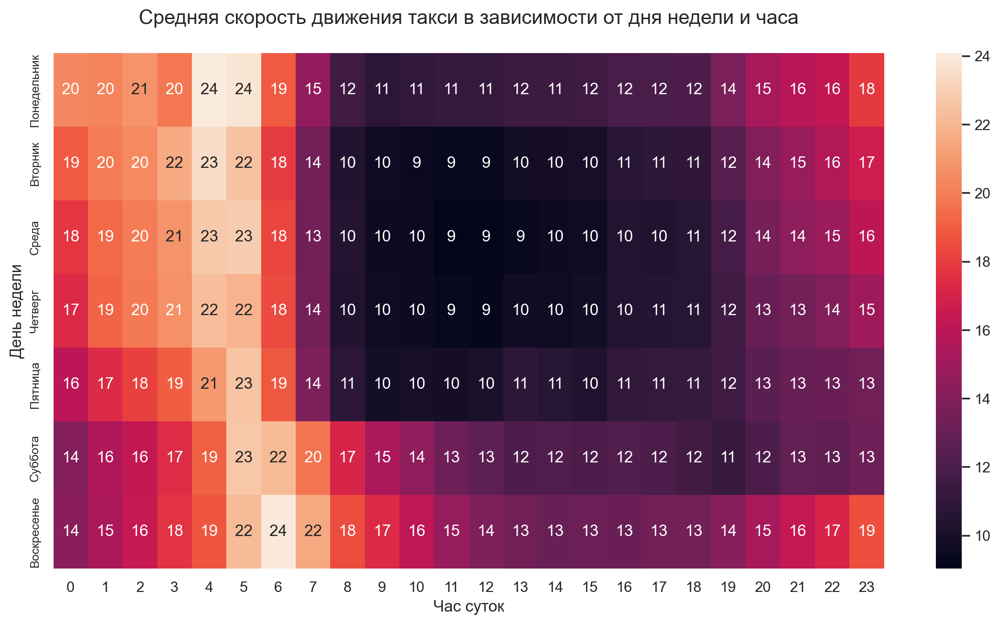

In [62]:
fig, ax = plt.subplots(figsize=(14, 7))
ax = sns.heatmap(df_month_hour_speed, annot=True, fmt=".0f", ax=ax)

ax.set_title('Средняя скорость движения такси в зависимости от дня недели и часа\n', fontsize=15)
ax.set_yticklabels(['Понедельник', 'Вторник', 'Среда', 'Четверг', 'Пятница', 'Суббота', 'Воскресенье'], rotation=90, fontsize=9)
ax.set_ylabel('День недели', fontsize=12)
ax.set_xlabel('Час суток', fontsize=12);

Не забудьте удалить колонку со значением скорости из данных!

**Вопрос**: Почему значение скорости нельзя использовать во время обучения?

**Ответ**: Мы получили скорость, используя расстояние и затраченное время. Конечно, при обучении таргеты не будут нам доступны, иначе скорость считать бы не пришлось :)

In [63]:
X_train = X_train.drop('mean_speed', axis='columns')
X_train.head()

,id,vendor_id,pickup_datetime,passenger_count,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,store_and_fwd_flag,day_of_week,month_number,hour_number,day_of_year,abnormal_jan,abnormal_may,haversine
502213,id1615460,2,2016-06-26 09:27:45,2,-74.013710,40.645393,-73.989510,40.669369,N,6,6,9,178,0,0,3.357771
505504,id3415975,1,2016-06-26 23:48:52,1,-74.007042,40.704967,-73.978287,40.728909,N,6,6,23,178,0,0,3.600011
381784,id2966434,2,2016-02-12 09:23:18,1,-73.958771,40.777939,-73.980530,40.770168,N,4,2,9,43,0,0,2.025772
835757,id1640176,2,2016-03-16 18:20:37,1,-73.970787,40.761066,-73.960129,40.775440,N,2,3,18,76,0,0,1.833080
1391835,id2659223,1,2016-04-14 19:57:43,2,-73.987328,40.760590,-74.007675,40.740807,N,3,4,19,105,0,0,2.788696


**Вопрос**: Посмотрите внимательно на график и скажите, в какие моменты времени скорость минимальна; максимальна.

**Ответ**: По графику видно, что, в среднем, максимальная скорость на дорогах наблюдается в будние дни в утреннее время (примерно с 1-2 часов до 5) и в выходные дни - с 5 до 7 утра. Минимальная же скорость наблюдается, в среднем, в будние дни с 8 утра до 16-17 часов вечера.
Эти значения примерно соответствуют квантилям уровней 0.85 и 0.15 (т.е. "топ-15%").

Создайте признаки "поездка совершается в период пробок" и "поездка совершается в период свободных дорог" (естественно, они не должен зависеть от скорости!):

In [64]:
print(f'Квантиль уровня 0.85: {round(np.quantile(df_month_hour_speed, q=0.85), 3)} \
    \nКвантиль уровня 0.85: {round(np.quantile(df_month_hour_speed, q=0.15), 3)}')

Квантиль уровня 0.85: 19.84     
Квантиль уровня 0.85: 10.317


In [65]:
good_road = {
    "mon": set([0, 1, 2, 3, 4, 5]),
    "tue": set([1, 2, 3, 4, 5]),
    "wed": set([2, 3, 4, 5]),
    "thu": set([2, 3, 4, 5]),
    "fri": set([4, 5]),
    "sat": set([5, 6, 7]),
    "sun": set([5, 6, 7])
}

bad_road = {
    "mon": set(),
    "tue": set([8, 9, 10, 11, 12, 13, 14, 15]),
    "wed": set([8, 9, 10, 11, 12, 13, 14, 15, 16, 17]),
    "thu": set([8, 9, 10, 11, 12, 13, 14, 15, 16]),
    "fri": set([9, 10, 11, 12, 15]),
    "sat": set(),
    "sun": set()
}

In [66]:
train['good_road'] = 0

train.loc[(train['day_of_week'] == 0) & (train['hour_number'].isin(good_road['mon'])), 'good_road'] += 1
train.loc[(train['day_of_week'] == 1) & (train['hour_number'].isin(good_road['tue'])), 'good_road'] += 1
train.loc[(train['day_of_week'] == 2) & (train['hour_number'].isin(good_road['wed'])), 'good_road'] += 1
train.loc[(train['day_of_week'] == 3) & (train['hour_number'].isin(good_road['thu'])), 'good_road'] += 1
train.loc[(train['day_of_week'] == 4) & (train['hour_number'].isin(good_road['fri'])), 'good_road'] += 1
train.loc[(train['day_of_week'] == 5) & (train['hour_number'].isin(good_road['sat'])), 'good_road'] += 1
train.loc[(train['day_of_week'] == 6) & (train['hour_number'].isin(good_road['sun'])), 'good_road'] += 1


train['bad_road'] = 0

train.loc[(train['day_of_week'] == 0) & (train['hour_number'].isin(bad_road['mon'])), 'bad_road'] += 1
train.loc[(train['day_of_week'] == 1) & (train['hour_number'].isin(bad_road['tue'])), 'bad_road'] += 1
train.loc[(train['day_of_week'] == 2) & (train['hour_number'].isin(bad_road['wed'])), 'bad_road'] += 1
train.loc[(train['day_of_week'] == 3) & (train['hour_number'].isin(bad_road['thu'])), 'bad_road'] += 1
train.loc[(train['day_of_week'] == 4) & (train['hour_number'].isin(bad_road['fri'])), 'bad_road'] += 1
train.loc[(train['day_of_week'] == 5) & (train['hour_number'].isin(bad_road['sat'])), 'bad_road'] += 1
train.loc[(train['day_of_week'] == 6) & (train['hour_number'].isin(bad_road['sun'])), 'bad_road'] += 1

In [67]:
shape = train.loc[train['good_road'] == 1].shape, train.loc[train['bad_road'] == 1].shape
print(f'Число поездок по свободным дорогам: {shape[0][0]} \nЧисло поездок по пробкам: {shape[1][0]}')

Число поездок по свободным дорогам: 55420 
Число поездок по пробкам: 329187


**Задание 8 (0.25 балла)**. Как уже было замечено выше, на карте выделяются две точки вдали от Манхэттена. Для каждой из них добавьте в выборку два признака: началась ли поездка в ней и закончилась ли она в ней.

Прим.: очевидно, что задать одну точку для каждого из аэропортов невозможно, поскольку это будет одна координата, в то время как люди вызывают такси на территории всего аэропорта.

Поэтому я решил "обрамить" оба аэропорта некоторым прямоугольником, задав его через неравенство, а затем сранивать поступающие координаты с ним. Точки для прямоугольника были взяты из сервиса Google Maps.

In [68]:
# создаем новые бинарные признаки для аэропорта им. Кеннеди
train['is_pickup_air_jfk'] = 0
train['is_dropoff_air_jfk'] = 0

# проверяем координаты
train.loc[((train['pickup_latitude'] > 40.62679) & (train['pickup_latitude'] < 40.66684)) & \
    ((train['pickup_longitude'] > -73.82156) & (train['pickup_longitude'] < -73.75402)), 'is_pickup_air_jfk'] += 1

train.loc[((train['dropoff_latitude'] > 40.62679) & (train['dropoff_latitude'] < 40.66684)) & \
    ((train['dropoff_longitude'] > -73.82156) & (train['dropoff_longitude'] < -73.75402)), 'is_dropoff_air_jfk'] += 1

# создаем новые бинарные признаки для аэропорта Ла-Гуардия
train['is_pickup_air_lg'] = 0
train['is_dropoff_air_lg'] = 0

# проверяем координаты
train.loc[((train['pickup_latitude'] > 40.76622) & (train['pickup_latitude'] < 40.78152)) & \
    ((train['pickup_longitude'] > -73.88796) & (train['pickup_longitude'] < -73.85591)), 'is_pickup_air_lg'] += 1

train.loc[((train['dropoff_latitude'] > 40.76622) & (train['dropoff_latitude'] < 40.78152)) & \
    ((train['dropoff_longitude'] > -73.88796) & (train['dropoff_longitude'] < -73.85591)), 'is_dropoff_air_lg'] += 1

In [69]:
shape_jfk = train.loc[train['is_pickup_air_jfk'] == 1].shape, train.loc[train['is_dropoff_air_jfk'] == 1].shape
print(f'Число поездок из аэропорта JFK: {shape_jfk[0][0]} \nЧисло поездок в аэропорт JFK: {shape_jfk[1][0]} \n')

shape_lg = train.loc[train['is_pickup_air_lg'] == 1].shape, train.loc[train['is_dropoff_air_lg'] == 1].shape
print(f'Число поездок из аэропорта JFK: {shape_lg[0][0]} \nЧисло поездок в аэропорт JFK: {shape_lg[1][0]}')

Число поездок из аэропорта JFK: 32120 
Число поездок в аэропорт JFK: 13058 

Число поездок из аэропорта JFK: 36964 
Число поездок в аэропорт JFK: 18070


In [70]:
subset_jfk_pickup = train.loc[train['is_pickup_air_jfk'] == 1]
subset_jfk_dropoff = train.loc[train['is_dropoff_air_jfk'] == 1]

subset_lg_pickup = train.loc[train['is_pickup_air_lg'] == 1]
subset_lg_dropoff = train.loc[train['is_dropoff_air_lg'] == 1]

*Можно раскомментировать следующие строки и посмотреть, какие поездки "поднимают" соответствующий флаг.*

**В начале аэропорт JFK:**

In [71]:
# место отправления - аэропорт JFK
show_circles_on_map(subset_jfk_pickup.sample(1000), "pickup_latitude", "pickup_longitude", "blue")

In [54]:
# посмотрим, куда едут из аэропорта JFK
# show_circles_on_map(subset_jfk_pickup.sample(1000), "dropoff_latitude", "dropoff_longitude", "blue")

In [55]:
# место назначения - аэропорт JFK
# show_circles_on_map(subset_jfk_dropoff.sample(1000), "dropoff_latitude", "dropoff_longitude", "blue")

In [56]:
# посмотрим, куда едут из аэропорта JFK
# show_circles_on_map(subset_jfk_dropoff.sample(1000), "pickup_latitude", "pickup_longitude", "blue")

**Далее аэропорт LG:**

In [72]:
# место отправления - аэропорт LG
show_circles_on_map(subset_lg_pickup.sample(1000), "pickup_latitude", "pickup_longitude", "blue")

In [58]:
# посмотрим, куда едут из аэропорта LG
# show_circles_on_map(subset_lg_pickup.sample(1000), "dropoff_latitude", "dropoff_longitude", "blue")

In [59]:
# место назначения - аэропорт LG
# show_circles_on_map(subset_lg_dropoff.sample(1000), "dropoff_latitude", "dropoff_longitude", "blue")

In [60]:
# посмотрим, откуда едут в аэропорт LG
# show_circles_on_map(subset_lg_dropoff.sample(1000), "pickup_latitude", "pickup_longitude", "blue")

Для каждого из созданных признаков нарисуйте "ящик с усами" (`sns.boxplot`) распределения логарифма времени поездки

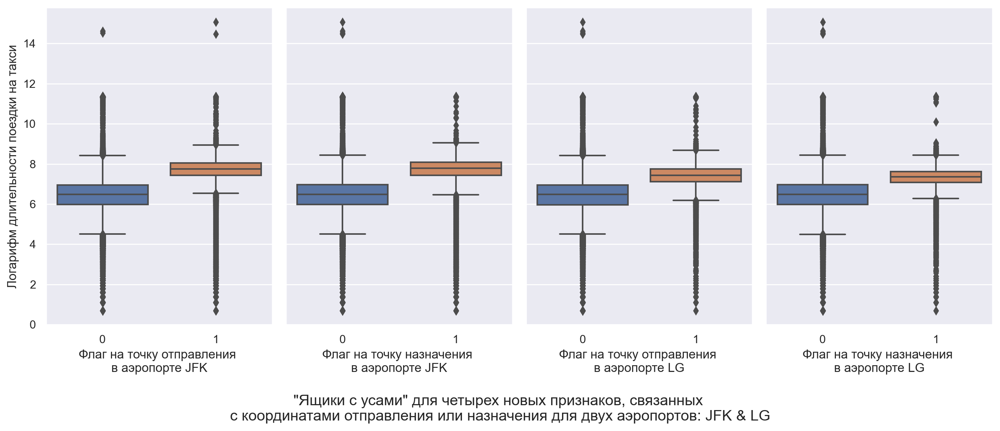

In [73]:
# идея для кода: https://stackoverflow.com/questions/38082602/plotting-multiple-different-plots-in-one-figure-using-seaborn

fig, axs = plt.subplots(ncols=4, figsize=(15,6.5))

sns.boxplot(data=train, x='is_pickup_air_jfk', y='log_trip_duration', ax=axs[0])
axs[0].set_ylabel('Логарифм длительности поездки на такси')
axs[0].set_xlabel('Флаг на точку отправления \nв аэропорте JFK')

sns.boxplot(data=train, x='is_dropoff_air_jfk', y='log_trip_duration', ax=axs[1])
axs[1].set_ylabel('')
axs[1].set_yticklabels('')
axs[1].set_xlabel('Флаг на точку назначения \nв аэропорте JFK')

sns.boxplot(data=train, x='is_pickup_air_lg', y='log_trip_duration', ax=axs[2])
axs[2].set_ylabel('')
axs[2].set_yticklabels('')
axs[2].set_xlabel('Флаг на точку отправления \nв аэропорте LG')

sns.boxplot(data=train, x='is_dropoff_air_lg', y='log_trip_duration', ax=axs[3])
axs[3].set_ylabel('')
axs[3].set_yticklabels('')
axs[3].set_xlabel('Флаг на точку назначения \nв аэропорте LG')

fig.suptitle('"Ящики с усами" для четырех новых признаков, связанных \nс координатами отправления или назначения для двух аэропортов: JFK & LG', y=0.035)
fig.tight_layout(rect=[0.05, 0.05, 0.95, 0.95])

**Вопрос**: судя по графикам, как вы думаете, хорошими ли получились эти признаки?

**Ответ**: признаки, отвечающие за первый аэропорт (Международный аэропорт имени Джона Кеннеди / JFK) явно выглядят лучше, чем за второй (аэропорт Ла-Гуардия / LG). Разница в среднем таргете для первого аэропорта больше, вероятно, потому что он находится за городом, туда точно в среднем ехать дольше. Второй аэропорт же находится в городе (в Куинсе), поэтому разница не столь значительна.

Но стоит отметить, что в целом признаки получились не столь качественными, как могли, из-за большого числа нетипичных значений и выбросов. Можно было заметить большое число поездок, которые начинались и заканчивались в одном и том же аэропорте - неважно, была ли это реальная поездка, отмененный заказ или сбой, это вносит большой шум в данные признаки. Такие "хвосты снизу" везде больше, чем "сверху".

<img src="https://www.dropbox.com/s/xson9nukz5hba7c/map.png?raw=1" align="right" width="20%" style="margin-left: 20px; margin-bottom: 20px">

**Задание 9 (1 балл)**. Сейчас мы почти что не используем сами значения координат. На это есть несколько причин: по отдельности рассматривать широту и долготу не имеет особого смысла, стоит рассматривать их вместе. Во-вторых, понятно, что зависимость между нашим таргетом и координатами не линейная. Чтобы как-то использовать координаты, можно прибегнуть к следующему трюку: обрамим область с наибольшим количеством поездок прямоугольником (как на рисунке). Разобьем этот прямоугольник на ячейки. Каждой точке сопоставим номер ее ячейки, а тем точкам, что не попали ни в одну из ячеек, сопоставим значение -1.

Напишите трансформер, который сначала разбивает показанную на рисунке область на ячейки, а затем создает два признака: номер ячейки, в которой началась поездка, и номер ячейки, в которой закончилась поездка. Количество строк и столбцов выберите самостоятельно.

Обратите внимание, что все вычисления должны быть векторизованными, трансформер не должен модифицировать передаваемую ему выборку inplace, а все необходимые статистики (если они вдруг нужны) нужно считать только по обучающей выборке в методе `fit`:

In [74]:
def check_whole_area(df, lat, lon, new_feature):
    '''
    Функция проверяет по входящим координатам,
    находится ли объект в Манхэттене и печатает
    число отобранных объектов
    '''
    df[new_feature] = 0

    df.loc[((df[lat] > 40.69982) & (df[lat] < 40.80265)) & \
        ((df[lon] > -74.02096) & (df[lon] < -73.93779)), new_feature] += 1
    
    df_shape = df.loc[df[new_feature] == 1].shape
    print(f'Число интересующих поездок: {df_shape[0]}')

    return df

In [75]:
def show_lines_and_circles_on_map(points, line_color='red', weight=5, opacity=1.0, 
        need_points=False, data=None, latitude_column=None, longitude_column=None, 
        point_color='blue', radius=100):
    """
    Функция создает карту формата folium и
    рисует линии (обязательно) и круги (опционально).
    Центр карты - это средняя координата поданных на вход данных для линий.
    
    points - лист из кортежей, содержащий информацию о координатах, которые
    нужно соединить линией. В кортеже под 0 индексом находится широта,
    под индексом 1 - долгота.
    Функция возвращает карту - объект folium.
    """
    lats = np.mean([x[0] for x in points])
    lons = np.mean([x[1] for x in points])
    location = (lats, lons)
    m = folium.Map(location=location)

    folium.PolyLine(points, 
        color=line_color,
        weight=weight, 
        opacity=opacity
        ).add_to(m)

    if need_points:
        for _, row in data.iterrows():
            folium.Circle(
                radius=radius,
                location=(row[latitude_column], row[longitude_column]),
                color=point_color,
                fill_color=point_color,
                fill=True
            ).add_to(m)

    return m

In [76]:
def draw_extra_line_on_map(m, points, line_color='red', weight=5, opacity=1.0):
    """
    Функция добавляет новые линии на созданную ранее карту.
    
    m - карта формата folium.
    """

    folium.PolyLine(points, 
        color=line_color,
        weight=weight, 
        opacity=opacity
        ).add_to(m)

    return m

In [77]:
def make_grid_5x3(list_t):
    '''
    Функция создает симметричную сетку 5 на 3 из координат.
    По умолчанию используются следующие координаты р-на Манхэттен:
    up_l = (40.80265, -74.02096)
    up_r = (40.80265, -73.93779)
    down_l = (40.69982, -74.02096)
    down_r = (40.69982, -73.93779)
    list_t = [up_l, up_r, down_r, down_l, up_l]
    '''
    up_lons = np.linspace(list_t[0][1], list_t[1][1], 4)
    up_lats = np.ones(len(up_lons)) * list_t[0][0]
    up_cord = (up_lats, up_lons)
    up_cord = [(up_cord[0][i], up_cord[1][i]) for i in range(len(up_cord[0]))]

    down_lons = up_lons
    down_lats = np.ones(len(down_lons)) * list_t[2][0]
    down_cord = (down_lats, down_lons)
    down_cord = [(down_cord[0][i], down_cord[1][i]) for i in range(len(down_cord[0]))]

    left_lats = np.linspace(list_t[0][0], list_t[2][0], 6)
    left_lons = np.ones(len(left_lats)) * list_t[0][1]
    left_cord = (left_lats, left_lons)
    left_cord = [(left_cord[0][i], left_cord[1][i]) for i in range(len(left_cord[0]))]

    right_lats = left_lats
    right_lons = np.ones(len(right_lats)) * list_t[1][1]
    right_cord = (right_lats, right_lons)
    right_cord = [(right_cord[0][i], right_cord[1][i]) for i in range(len(right_cord[0]))]

    # задаем координаты в виде "линий"
    line_0 = left_cord
    line_1 = [(left_cord[i][0], down_cord[1][1]) for i in range(6)]
    line_2 = [(left_cord[i][0], down_cord[2][1]) for i in range(6)]
    line_3 = right_cord

    return line_0, line_1, line_2, line_3

In [79]:
from sklearn.base import BaseEstimator, TransformerMixin
    
class MapGridTransformer(BaseEstimator, TransformerMixin):
    def __init__(self):
        # по умолчанию используются следующие координаты р-на Манхэттен: 
        self.up_l = (40.80265, -74.02096)
        self.up_r = (40.80265, -73.93779)
        self.down_l = (40.69982, -74.02096)
        self.down_r = (40.69982, -73.93779)
    
    def show_map(self, df=None, with_points=False, point_feature=None, box_number=1, pickup_or_dropoff='pickup'):
        if with_points:                                                          # если нужно отрисовать точки - координаты поездок
            subset = df.loc[df[point_feature] == box_number]
            print(f'Размер выборки для визуализации: {subset.shape[0]} \
                \nНа карте: 1000 или меньше')

            if pickup_or_dropoff == 'pickup':                                    # выбираем, хотим ли мы отрисовать место назначения
                latitude_column = 'pickup_latitude'                              # или место отправления
                longitude_column = 'pickup_longitude'
            else:
                latitude_column = 'dropoff_latitude'
                longitude_column = 'dropoff_longitude'

            m = show_lines_and_circles_on_map(self.area, weight=8, opacity=1.0, 
                need_points=True, data=subset.sample(1000), latitude_column=latitude_column, 
                longitude_column=longitude_column, point_color="blue")
            m = draw_extra_line_on_map(m, [self.line_1[0], self.line_1[-1]])
            m = draw_extra_line_on_map(m, [self.line_2[0], self.line_2[-1]])

            for i in range(1, 5):
                m = draw_extra_line_on_map(m, [self.line_0[i], self.line_3[i]])
            return m

        m = show_lines_and_circles_on_map(self.area, weight=8, opacity=1.0)
        m = draw_extra_line_on_map(m, [self.line_1[0], self.line_1[-1]])
        m = draw_extra_line_on_map(m, [self.line_2[0], self.line_2[-1]])

        for i in range(1, 5):
            m = draw_extra_line_on_map(m, [self.line_0[i], self.line_3[i]])
        return m

    
    def fit(self, X=None, y=None):
        # создаем сетку, которая будет использоваться для создания признаков и визаулизации
        area = [self.up_l, self.up_r, self.down_r, self.down_l, self.up_l]
        self.line_0, self.line_1, self.line_2, self.line_3 = make_grid_5x3(area)
        self.area = area
        
        return self

    def transform(self, X, y=None):
        df = X.copy()

        # проверим, какие поездки начинаются или заканчиваются в Манхэттене
        df = check_whole_area(df, 'pickup_latitude', 'pickup_longitude', new_feature='is_manh_pickup')
        df = check_whole_area(df, 'dropoff_latitude', 'dropoff_longitude', new_feature='is_manh_dropoff')
        df['box_manh_pickup'] = -1
        df['box_manh_dropoff'] = -1

        # заполним новые признаки - поездка началась или закончилась 
        # в той или иной ячейке новой сетки
        # обработаем ячейки с 1 по 5:
        for i in range(5):
            df.loc[((df['pickup_latitude'] > self.line_0[i+1][0]) & (df['pickup_latitude'] < self.line_0[i][0])) & \
                ((df['pickup_longitude'] > self.line_0[0][1]) & (df['pickup_longitude'] < self.line_1[0][1])), 'box_manh_pickup'] = i+1

            df.loc[((df['dropoff_latitude'] > self.line_0[i+1][0]) & (df['dropoff_latitude'] < self.line_0[i][0])) & \
                ((df['dropoff_longitude'] > self.line_0[0][1]) & (df['dropoff_longitude'] < self.line_1[0][1])), 'box_manh_dropoff'] = i+1

        # обработаем ячейки с 6 по 10:
        for i in range(5):
            df.loc[((df['pickup_latitude'] > self.line_1[i+1][0]) & (df['pickup_latitude'] < self.line_1[i][0])) & \
                ((df['pickup_longitude'] > self.line_1[0][1]) & (df['pickup_longitude'] < self.line_2[0][1])), 'box_manh_pickup'] = i+6

            df.loc[((df['dropoff_latitude'] > self.line_1[i+1][0]) & (df['dropoff_latitude'] < self.line_1[i][0])) & \
                ((df['dropoff_longitude'] > self.line_1[0][1]) & (df['dropoff_longitude'] < self.line_2[0][1])), 'box_manh_dropoff'] = i+6

        # обработаем ячейки с 11 по 15:
        for i in range(5):
            df.loc[((df['pickup_latitude'] > self.line_2[i+1][0]) & (df['pickup_latitude'] < self.line_2[i][0])) & \
                ((df['pickup_longitude'] > self.line_2[0][1]) & (df['pickup_longitude'] < self.line_3[0][1])), 'box_manh_pickup'] = i+11

            df.loc[((df['dropoff_latitude'] > self.line_2[i+1][0]) & (df['dropoff_latitude'] < self.line_2[i][0])) & \
                ((df['dropoff_longitude'] > self.line_2[0][1]) & (df['dropoff_longitude'] < self.line_3[0][1])), 'box_manh_dropoff'] = i+11
        
        return df

*Еще раз разделим выборку, т.к. ранее было создано много новых признаков; было удобно делать это сразу для всей выборки:*

In [80]:
X_train, X_test = train_test_split(train, train_size=0.7, test_size=0.3, random_state=13)

y_train = X_train['log_trip_duration']
y_test = X_test['log_trip_duration']

X_train = X_train.drop('log_trip_duration', axis='columns')
X_test = X_test.drop('log_trip_duration', axis='columns')

In [81]:
GridTrans = MapGridTransformer()

In [82]:
GridTrans.fit(X_train)
X_train = GridTrans.transform(X_train)
X_test = GridTrans.transform(X_test)

# в начале посмотрим на сетку и то, как поездки ложатся на нее:
GridTrans.show_map(df=X_train, with_points=True, point_feature='is_manh_pickup', pickup_or_dropoff='pickup')

Число интересующих поездок: 934288
Число интересующих поездок: 888569
Число интересующих поездок: 399950
Число интересующих поездок: 380392
Размер выборки для визуализации: 934288                 
На карте: 1000 или меньше


In [83]:
# посмотрим, например, на 11 сектор:
GridTrans.show_map(df=X_train, with_points=True, point_feature='box_manh_pickup', box_number=11, pickup_or_dropoff='pickup')

Размер выборки для визуализации: 28003                 
На карте: 1000 или меньше


*Кажется, все работает хорошо!*

**Задание 10 (0.25 балла)**. Обучите `Ridge`-регрессию со стандартными параметрами на признаках, которые мы выделили к текущему моменту. Категориальные признаки закодируйте через one-hot-кодирование, числовые признаки отмасштабируйте.

In [84]:
# отберем категориальные и числовые признаки
categorial_train = X_train[['day_of_week', 'month_number', 'hour_number', 
       'abnormal_jan', 'abnormal_may', 'good_road', 'bad_road', 'is_pickup_air_jfk', 
       'is_dropoff_air_jfk', 'is_pickup_air_lg', 'is_dropoff_air_lg', 
       'box_manh_pickup', 'box_manh_dropoff']]
numeric_train = X_train[['log_haversine', 'day_of_year']]

categorial_test = X_test[['day_of_week', 'month_number', 'hour_number', 
       'abnormal_jan', 'abnormal_may', 'good_road', 'bad_road', 'is_pickup_air_jfk', 
       'is_dropoff_air_jfk', 'is_pickup_air_lg', 'is_dropoff_air_lg', 
       'box_manh_pickup', 'box_manh_dropoff']]
numeric_test = X_test[['log_haversine', 'day_of_year']]

In [85]:
ohe = OneHotEncoder(sparse=False)

categorial_train_tr = ohe.fit_transform(categorial_train)
categorial_test_tr = ohe.transform(categorial_test)

scaler = StandardScaler()

numeric_train_tr = scaler.fit_transform(numeric_train)
numeric_test_tr = scaler.transform(numeric_test)

In [86]:
X_train_trans = np.concatenate((categorial_train_tr, numeric_train_tr), axis=1)
X_test_trans = np.concatenate((categorial_test_tr, numeric_test_tr), axis=1)

In [87]:
model = Ridge(random_state=13)

model.fit(X_train_trans, y_train)
pred_test = model.predict(X_test_trans)
pred_train = model.predict(X_train_trans)

rmse_test = mean_squared_error(pred_test, y_test, squared=False)
rmse_train = mean_squared_error(pred_train, y_train, squared=False)

print(f'RMSLE на тесте: {round(rmse_test, 4)}, \nRMSLE на трейне: {round(rmse_train, 4)}')

RMSLE на тесте: 0.474, 
RMSLE на трейне: 0.476


**Намного лучше**, чем раньше!

Было: 
* $0.7876$ - для предыдущих признаков
* $0.7958$ - бейзлайн 

## Часть 3. Изучаем оставшиеся признаки (1 балл)

**Задание 11 (0.75 баллов)**. У нас осталось еще 3 признака, которые мы не исследовали: `vendor_id`, `passenger_count` и `store_and_fwd_flag`.

**Вопрос**: Подумайте, почему каждый из этих признаков может быть потенциально полезным.

**Ответ**: 
* `vendor_id` - у каждого из провайдеров может быть своя специфика: начиная от "заточенности" на определенном районе / времени работы, заканчивая разнице в моделях машин, что тоже может сказываться за продолжительности поездки;
* `passenger_count` - возможно, поездки для 1 человека будут короткими (например, рабочие по Манхэттену), а поездки на большое число людей - дольше (за город в гости или в аэропорт);
* `store_and_fwd_flag` - отсутствие связи может свидетельствовать о некотором сбое, что может нести в себе какую-то информацию (большая нагрузка/выехал за город/плохая погода => пробки...)

Посчитайте, сколько есть уникальных значений у каждого из этих признаков:

In [88]:
n_id = train['vendor_id'].nunique()
set_id = set(train['vendor_id'].unique())

print(f'Признак `vendor_id` принимает {n_id} значений(-я) \nВот они: {set_id}\n')

n_passenger = train['passenger_count'].nunique()
set_passenger = set(train['passenger_count'].unique())

print(f'Признак `passenger_count` принимает {n_passenger} значений(-я) \nВот они: {set_passenger}\n')

n_flag = train['store_and_fwd_flag'].nunique()
set_flag = set(train['store_and_fwd_flag'].unique())

print(f'Признак `store_and_fwd_flag` принимает {n_flag} значений(-я) \nВот они: {set_flag}')

Признак `vendor_id` принимает 2 значений(-я) 
Вот они: {1, 2}

Признак `passenger_count` принимает 10 значений(-я) 
Вот они: {0, 1, 2, 3, 4, 5, 6, 7, 8, 9}

Признак `store_and_fwd_flag` принимает 2 значений(-я) 
Вот они: {'N', 'Y'}


Постройте "ящики с усами" распределений логарифма времени поездки в зависимости от значений каждого из признаков

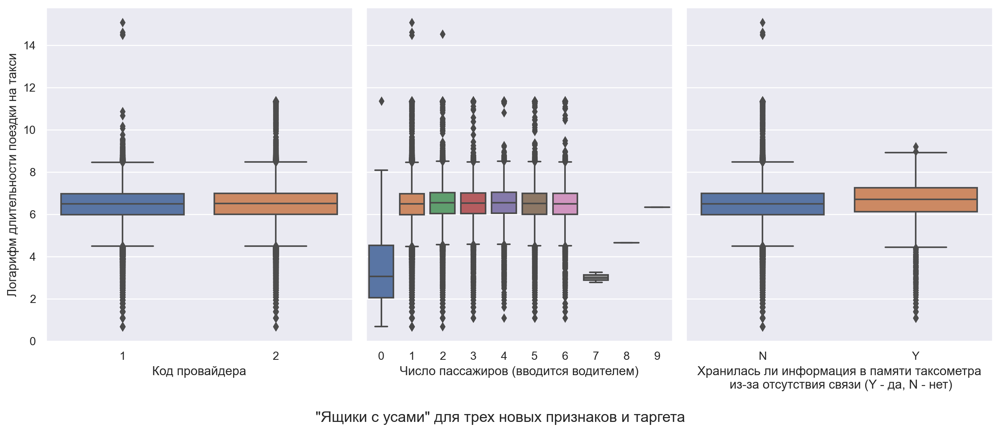

In [89]:
# идея для кода: https://stackoverflow.com/questions/38082602/plotting-multiple-different-plots-in-one-figure-using-seaborn

fig, axs = plt.subplots(ncols=3, figsize=(15,6.5))

sns.boxplot(data=train, x='vendor_id', y='log_trip_duration', ax=axs[0])
axs[0].set_ylabel('Логарифм длительности поездки на такси')
axs[0].set_xlabel('Код провайдера')

sns.boxplot(data=train, x='passenger_count', y='log_trip_duration', ax=axs[1])
axs[1].set_ylabel('')
axs[1].set_yticklabels('')
axs[1].set_xlabel('Число пассажиров (вводится водителем)')

sns.boxplot(data=train, x='store_and_fwd_flag', y='log_trip_duration', ax=axs[2])
axs[2].set_ylabel('')
axs[2].set_yticklabels('')
axs[2].set_xlabel('Хранилась ли информация в памяти таксометра\n из-за отсутствия связи (Y - да, N - нет)')

fig.suptitle('"Ящики с усами" для трех новых признаков и таргета', y=0.035)
fig.tight_layout(rect=[0.05, 0.05, 0.95, 0.95])

Переведите признаки `vendor_id` и `store_and_fwd_flag` в значения $\{0;1\}$

In [90]:
train['vendor_id'] = (train["vendor_id"].values == 2).astype(int)
train['store_and_fwd_flag'] = (train["store_and_fwd_flag"].values == 'Y').astype(int)

In [91]:
n_id = train['vendor_id'].nunique()
set_id = set(train['vendor_id'].unique())

print(f'Признак `vendor_id` принимает {n_id} значений(-я) \nВот они: {set_id}\n')

n_flag = train['store_and_fwd_flag'].nunique()
set_flag = set(train['store_and_fwd_flag'].unique())

print(f'Признак `store_and_fwd_flag` принимает {n_flag} значений(-я) \nВот они: {set_flag}')

Признак `vendor_id` принимает 2 значений(-я) 
Вот они: {0, 1}

Признак `store_and_fwd_flag` принимает 2 значений(-я) 
Вот они: {0, 1}


Обновим `X_train` и `X_test`:

In [92]:
X_train, X_test = train_test_split(train, train_size=0.7, test_size=0.3, random_state=13)

# y_train = X_train['log_trip_duration']
# y_test = X_test['log_trip_duration']

# X_train = X_train.drop('log_trip_duration', axis='columns')
# X_test = X_test.drop('log_trip_duration', axis='columns')

In [93]:
GridTrans = MapGridTransformer()
GridTrans.fit(X_train)
X_train = GridTrans.transform(X_train)
X_test = GridTrans.transform(X_test)

Число интересующих поездок: 934288
Число интересующих поездок: 888569
Число интересующих поездок: 399950
Число интересующих поездок: 380392


**Вопрос**: Основываясь на графиках выше, как вы думаете, будут ли эти признаки сильными?

**Ответ**: 
1. Видно, что признак, отвечающий за код провайдера, скорее всего, будет бесполезным, т.к. его ящики с усами идентичны, исключая лишь тот факт, что у одного из провайдеров есть выбросы, а у второго - нет.
2. В признаке, отвечающим за число пассажиров, смущают поездки, у которых было *0 пассажиров*, их происхождение неизвестно, но их очень мало (60 штук), вероятно, это ошибки. Сам признак, скорее всего, будет слабым для значений пассажиров 1-6: значения таргета на них практически не отличаются (лишь у 1 чуть меньше, а у 4 чуть больше). Но для 7-9 пассажиров есть большой разброс, но таких поездок мало (3, 1 и 1 соответственно). В целом, признак мало полезен.
3. Для признака, отвечающего за хранение информации в таксометре при отсутствии связи, дело лучше: в положительном случае есть небольшое отклонение вверх относительно отрицательных случаев, и их достаточно много (8045 штук).

**Задание 12 (0.25 баллов)**. Проверьте свои предположения, обучив модель в том числе и на этих трех признаках. Обучайте `Ridge`-регрессию со стандартными параметрами. Категориальные признаки закодируйте one-hot-кодированием, а численные отмасштабируйте.

*Для удобства сравнения я добавлю `ColumnTransformer` и `Pipeline`, а также еще раз обучу `Ridge`-регрессию на старых признаках для сравнения:*

In [94]:
# зададим названия колонок с признаками для ColumnTransformer
categorical = ['day_of_week', 'month_number', 'hour_number', 
       'abnormal_jan', 'abnormal_may', 'good_road', 'bad_road', 'is_pickup_air_jfk', 
       'is_dropoff_air_jfk', 'is_pickup_air_lg', 'is_dropoff_air_lg', 
       'box_manh_pickup', 'box_manh_dropoff']

numeric = ['log_haversine', 'day_of_year']

In [95]:
column_transformer = ColumnTransformer([
    ('ohe', OneHotEncoder(), categorical),
    ('scaling', StandardScaler(), numeric)
])

pipeline = Pipeline(steps=[
    ('ohe_and_scaling', column_transformer),
    ('regression', Ridge(random_state=13))
])

model = pipeline.fit(X_train, y_train)
pred_test = model.predict(X_test)
pred_train = model.predict(X_train)

rmse_test = mean_squared_error(pred_test, y_test, squared=False)
rmse_train = mean_squared_error(pred_train, y_train, squared=False)

print(f'RMSLE на тесте: {round(rmse_test, 4)}, \nRMSLE на трейне: {round(rmse_train, 4)}')

RMSLE на тесте: 0.474, 
RMSLE на трейне: 0.476


In [96]:
# добавляем новые признаки
categorical.extend(['vendor_id', 'passenger_count', 'store_and_fwd_flag'])

In [97]:
column_transformer = ColumnTransformer([
    ('ohe', OneHotEncoder(), categorical),
    ('scaling', StandardScaler(), numeric)
])

pipeline = Pipeline(steps=[
    ('ohe_and_scaling', column_transformer),
    ('regression', Ridge(random_state=13))
])

model = pipeline.fit(X_train, y_train)
pred_test = model.predict(X_test)
pred_train = model.predict(X_train)

rmse_test = mean_squared_error(pred_test, y_test, squared=False)
rmse_train = mean_squared_error(pred_train, y_train, squared=False)

print(f'RMSLE на тесте: {round(rmse_test, 4)}, \nRMSLE на трейне: {round(rmse_train, 4)}')

RMSLE на тесте: 0.4737, 
RMSLE на трейне: 0.4756


*Итак, метрика на тестовой и обучающей выборке улучшилась на $0.0003$ и $0.0004$, совсем **ненамного**. Тем не менее, предлагаю оставить их.*

Если признаки не дали какого-то ощутимого улучшения метрики, их можно выбросить из данных.

## Часть 4. Улучшаем модель (3 балла)

**Задание 13 (1 балл)**. В наших данных есть нетипичные объекты: с аномально маленьким времени поездки, с очень большим пройденным расстоянием или очень большими остатками регрессии. В этом задании предлагается исключить такие объекты из обучающей выборки. Для этого нарисуйте гистограммы распределения упомянутых выше величин, выберите объекты, которые можно назвать выбросами, и очистите обучающую выборку от них.

Отметим, что хотя эти объекты и выглядят как выбросы, в тестовой выборке тоже скорее всего будут объекты с такими же странными значениями целевой переменной и/или признаков. Поэтому, возможно, чистка обучающей выборки приведёт к ухудшению качества на тесте. Тем не менее, всё равно лучше удалять выбросы из обучения, чтобы модель получалась более разумной и интерпретируемой.

*Здесь и далее я попробую определить значения, которые можно признать выбросами не просто "на глаз", но и статистически.*

In [98]:
# статистическая граница выбросов

q_005 = np.quantile(X_train['log_trip_duration'], q=0.005)
q_0025 = np.quantile(X_train['log_trip_duration'], q=0.0025)
q_25 = np.quantile(X_train['log_trip_duration'], q=0.25)
q_75 = np.quantile(X_train['log_trip_duration'], q=0.75)

delta = q_75 - q_25
b_u = q_75 + delta*3
b_d = q_25 - delta*3

print(f'Статистический интервал типичных значений: [{round(b_d, 3)}; {round(b_u, 3)}]')
print(f'Квантиль уровня 0.005: {round(q_005, 3)}')
print(f'Квантиль уровня 0.0025: {round(q_0025, 3)}')
print(f'Содержательно значение логарифма 3 равно: {round(np.expm1(3), 0)} секунд')

Статистический интервал типичных значений: [3.0; 9.968]
Квантиль уровня 0.005: 3.932
Квантиль уровня 0.0025: 3.045
Содержательно значение логарифма 3 равно: 19.0 секунд


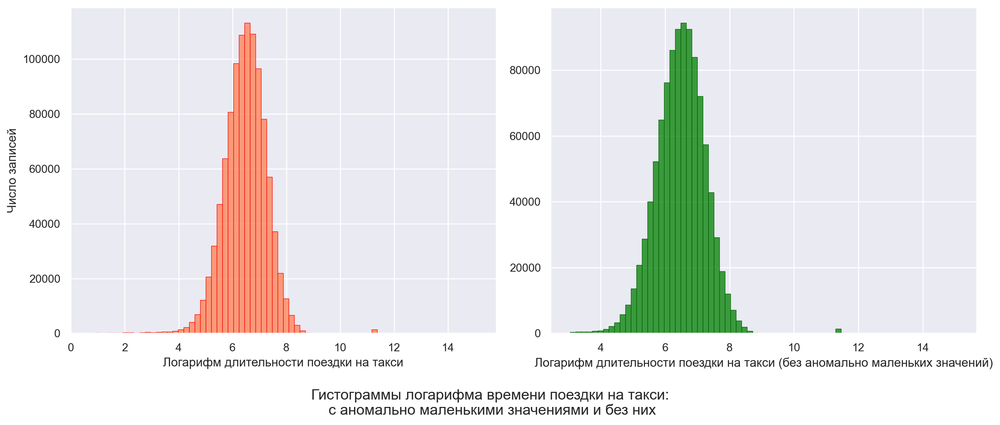

In [99]:
fig, axs = plt.subplots(ncols=2, figsize=(15,6.5))

sns.histplot(X_train['log_trip_duration'],
             bins=70,
             ax=axs[0], 
             color='coral',
             edgecolor='red')
axs[0].set_ylabel('Число записей')
axs[0].set_xlabel('Логарифм длительности поездки на такси')

sns.histplot(X_train.loc[X_train['log_trip_duration'] > 3]['log_trip_duration'],
             bins=70,
             ax=axs[1], 
             color='green',
             edgecolor='darkgreen')
axs[1].set_ylabel('')
axs[1].set_xlabel('Логарифм длительности поездки на такси (без аномально маленьких значений)')

fig.suptitle('Гистограммы логарифма времени поездки на такси: \nс аномально маленькими значениями и без них', y=0.035)
fig.tight_layout(rect=[0.05, 0.05, 0.95, 0.95])

In [100]:
# статистическая граница выбросов

q_995 = np.quantile(X_train['log_haversine'], q=0.995)
q_25 = np.quantile(X_train['log_haversine'], q=0.25)
q_75 = np.quantile(X_train['log_haversine'], q=0.75)

delta = q_75 - q_25
b_u = q_75 + delta*3
b_d = q_25 - delta*3

print(f'Статистический интервал типичных значений: [{round(b_d, 3)}; {round(b_u, 3)}]')
print(f'Квантиль уровня 0.995: {round(q_995, 3)}')
print(f'Содержательно значение логарифма 3.5 равно: {round(np.expm1(3.5), 2)} км')

Статистический интервал типичных значений: [-1.541; 3.927]
Квантиль уровня 0.995: 3.116
Содержательно значение логарифма 3.5 равно: 32.12 км


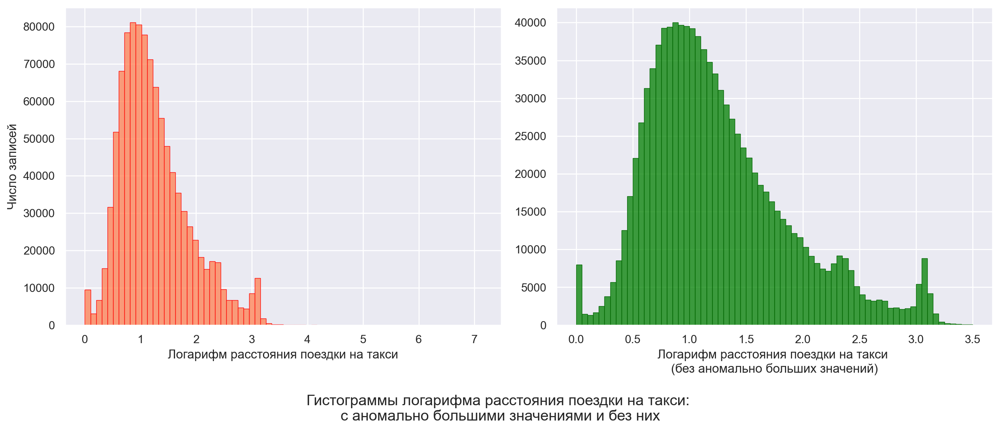

In [101]:
fig, axs = plt.subplots(ncols=2, figsize=(15,6.5))

sns.histplot(X_train['log_haversine'],
             bins=70,
             ax=axs[0], 
             color='coral',
             edgecolor='red')
axs[0].set_ylabel('Число записей')
axs[0].set_xlabel('Логарифм расстояния поездки на такси')

sns.histplot(X_train.loc[X_train['log_haversine'] < 3.5]['log_haversine'],
             bins=70,
             ax=axs[1], 
             color='green',
             edgecolor='darkgreen')
axs[1].set_ylabel('')
axs[1].set_xlabel('Логарифм расстояния поездки на такси \n(без аномально больших значений)')

fig.suptitle('Гистограммы логарифма расстояния поездки на такси: \nс аномально большими значениями и без них', y=0.035)
fig.tight_layout(rect=[0.05, 0.05, 0.95, 0.95])

In [102]:
model = pipeline.fit(X_train, y_train)
pred_train = model.predict(X_train)

residuals = pred_train - y_train
residuals_sq = np.sqrt(residuals ** 2)

In [103]:
# статистическая граница выбросов

q_995 = np.quantile(residuals_sq, q=0.995)
q_25 = np.quantile(residuals_sq, q=0.25)
q_75 = np.quantile(residuals_sq, q=0.75)

delta = q_75 - q_25
b_u = q_75 + delta*3
b_d = q_25 - delta*3

print(f'Статистический интервал типичных значений: [{round(b_d, 3)}; {round(b_u, 3)}]')
print(f'Квантиль уровня 0.995: {round(q_995, 3)}')

Статистический интервал типичных значений: [-0.844; 1.393]
Квантиль уровня 0.995: 2.051


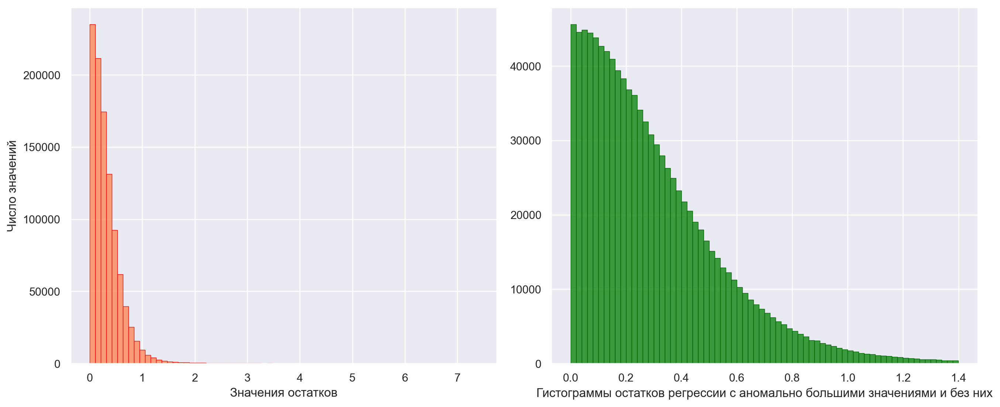

In [104]:
fig, axs = plt.subplots(ncols=2, figsize=(15,6.5))

sns.histplot(residuals_sq,
             bins=70,
             ax=axs[0], 
             color='coral',
             edgecolor='red')
axs[0].set_ylabel('Число значений')
axs[0].set_xlabel('Значения остатков')

sns.histplot(residuals_sq.loc[residuals_sq < 1.4],
             bins=70,
             ax=axs[1], 
             color='green',
             edgecolor='darkgreen')
axs[1].set_ylabel('')
axs[1].set_xlabel('Гистограммы остатков регрессии с аномально большими значениями и без них')

fig.suptitle('', y=0.035)
fig.tight_layout(rect=[0.05, 0.05, 0.95, 0.95])

In [105]:
start = X_train.shape[0]
print(f'Было: {start}')

# время
bad_time_ind = X_train.loc[X_train['log_trip_duration'] < 3].index
print(f'Плохих значений {len(bad_time_ind)} штук')
X_train = X_train.drop(bad_time_ind)
y_train = y_train.drop(bad_time_ind)

del1 = X_train.shape[0]
print(f'Удалено {start - del1}')

# расстояние
bad_distance_ind = X_train.loc[X_train['log_haversine'] > 3.5].index
print(f'Плохих значений {len(bad_distance_ind)} штук')
X_train = X_train.drop(bad_distance_ind)
y_train = y_train.drop(bad_distance_ind)

del2 = X_train.shape[0]
print(f'Удалено {del1 - del2}')

# остатки
bad_res_ind = residuals_sq.loc[residuals_sq > 1.4].index
print(f'Плохих значений {len(bad_res_ind)} штук')
X_train = X_train.drop(bad_res_ind, errors='ignore')
y_train = y_train.drop(bad_res_ind, errors='ignore')

del3 = X_train.shape[0]
print(f'Удалено {del2 - del3}')
print(f'Осталось {del3}')

Было: 1021050
Плохих значений 2500 штук
Удалено 2500
Плохих значений 308 штук
Удалено 308
Плохих значений 11217 штук
Удалено 8835
Осталось 1009407


Сейчас у нас очень много категориальных признаков. В категориальных признаках могут содержаться редкие категории, обычно это плохо: модель сильно переобучается на таких примерах. Попробуйте объединить редкие категории в одну. Естественно, делать это нужно только для действительно редких категорий.

In [106]:
# вспомним, сколько уникальных значений у каждого кат. признака
X_train[categorical].nunique()

day_of_week            7
month_number           6
hour_number           24
abnormal_jan           2
abnormal_may           2
good_road              2
bad_road               2
is_pickup_air_jfk      2
is_dropoff_air_jfk     2
is_pickup_air_lg       2
is_dropoff_air_lg      2
box_manh_pickup       16
box_manh_dropoff      16
vendor_id              2
passenger_count        8
store_and_fwd_flag     2
dtype: int64

In [107]:
X_train['box_manh_pickup'].value_counts()

 8     256422
 7     136719
 12    111858
 9      97061
 4      96864
-1      84049
 3      68722
 5      52042
 6      43781
 11     27714
 13     12741
 10     10698
 2       5457
 15      4184
 14      1094
 1          1
Name: box_manh_pickup, dtype: int64

In [108]:
X_train['box_manh_dropoff'].value_counts()

 8     238882
-1     129600
 7     121487
 12    109218
 9      86988
 4      82119
 3      62390
 5      52775
 6      44114
 11     35974
 13     14283
 10     12019
 15      9164
 2       6472
 14      3889
 1         33
Name: box_manh_dropoff, dtype: int64

In [109]:
X_train['passenger_count'].value_counts()

1    714995
2    145578
5     54132
3     41465
6     33427
4     19793
0        16
9         1
Name: passenger_count, dtype: int64

Я бы объединил в одно значение следющие признаки:
* прямоугольники Манхэттена под номерами 1, 2, 14, 15, т.к. в них попадает очень мало поездок, к тому формально они находятся за пределами Манхэттена;
* число пассажиров, равное 0, 7, 8, 9: их мало (или совсем нет после чистки нетипичных значений), к тому же мне кажется, что они подразумевают что-то странное.

Вообще говоря, судя по ящику с усами, значения таргета у поездок с числом пасссажиров, равным всем другим числам, кроме 1 и 4, не сильно отличается, но я не буду их трогать, т.к. я бы не назвал их редкими.

In [110]:
X_train.loc[(X_train['box_manh_pickup'] == 1) | (X_train['box_manh_pickup'] == 2) \
    | (X_train['box_manh_pickup'] == 14) | (X_train['box_manh_pickup'] == 15), 'box_manh_pickup'] = 99
X_train.loc[(X_train['box_manh_dropoff'] == 1) | (X_train['box_manh_dropoff'] == 2) \
    | (X_train['box_manh_dropoff'] == 14) | (X_train['box_manh_dropoff'] == 15), 'box_manh_dropoff'] = 99
X_train.loc[(X_train['passenger_count'] == 0) | (X_train['passenger_count'] == 7) \
    | (X_train['passenger_count'] == 8) | (X_train['passenger_count'] == 9), 'passenger_count'] = -1

In [111]:
X_test.loc[(X_test['box_manh_pickup'] == 1) | (X_test['box_manh_pickup'] == 2) \
    | (X_test['box_manh_pickup'] == 14) | (X_test['box_manh_pickup'] == 15), 'box_manh_pickup'] = 99
X_test.loc[(X_test['box_manh_dropoff'] == 1) | (X_test['box_manh_dropoff'] == 2) \
    | (X_test['box_manh_dropoff'] == 14) | (X_test['box_manh_dropoff'] == 15), 'box_manh_dropoff'] = 99
X_test.loc[(X_test['passenger_count'] == 0) | (X_test['passenger_count'] == 7) \
    | (X_test['passenger_count'] == 8) | (X_test['passenger_count'] == 9), 'passenger_count'] = -1

Обучите модель на очищенных данных и посчитайте качество на тестовой выборке.

In [112]:
model = pipeline.fit(X_train, y_train)
pred_test = model.predict(X_test)
pred_train = model.predict(X_train)

rmse_test = mean_squared_error(pred_test, y_test, squared=False)
rmse_train = mean_squared_error(pred_train, y_train, squared=False)

print(f'RMSLE на тесте: {round(rmse_test, 4)}, \nRMSLE на трейне: {round(rmse_train, 4)}')

RMSLE на тесте: 0.4739, 
RMSLE на трейне: 0.3872


*Итак, видим, что качество на тестовой выборке незначительно увеличилось (на 0.0002), но вот качество на обучающей выборке (логично) уменьшилось почти на 0.1!*

**Задание 14 (1 балл)**. После OneHot-кодирования количество признаков в нашем датасете сильно возрастает. Посчитайте колиество признаков до и после кодирования категориальных признаков.

In [115]:
before = X_train[categorical].shape[1]

ohe = OneHotEncoder(sparse=False)
after = ohe.fit_transform(X_train[categorical]).shape[1]

print(f'До кодирования: {before} категориальных признаков \nПосле кодирования: {after} категориальных признаков')

До кодирования: 16 категориальных признаков 
После кодирования: 90 категориальных признаков


Попробуйте обучить не `Ridge`-, а `Lasso`-регрессию. Какой метод лучше?

In [116]:
pipeline_lasso = Pipeline(steps=[
    ('ohe_and_scaling', column_transformer),
    ('regression', Lasso(random_state=13))
])

model = pipeline_lasso.fit(X_train, y_train)
pred_test = model.predict(X_test)
pred_train = model.predict(X_train)

rmse_test = mean_squared_error(pred_test, y_test, squared=False)
rmse_train = mean_squared_error(pred_train, y_train, squared=False)

print(f'RMSLE на тесте: {round(rmse_test, 4)}, \nRMSLE на трейне: {round(rmse_train, 4)}')

RMSLE на тесте: 0.7949, 
RMSLE на трейне: 0.7312


*`Ridge`-регрессия с параметрами по умолчанию показала результат намного лучше, чем `Lasso`-регресссия с параметрами по умолчанию, практически в два раза: RMSLE на тесте 0.4739 против 0.7949 (как будет выяснено далее, вторая выдает константный прогноз, хотя это понятно по сравнению с бейзлайном).*

Разбейте обучающую выборку на обучающую и валидационную в отношении 8:2. По валидационной выборке подберите оптимальные значения параметра регуляризации (по логарифмической сетке) для `Ridge` и `Lasso`, на тестовой выборке измерьте качество лучшей полученной модели.

In [117]:
X_train_small, X_val, y_train_small, y_val = train_test_split(X_train, y_train, train_size=0.8, test_size=0.2, random_state=13)

# y_train = X_train['log_trip_duration']
# y_val = X_val['log_trip_duration']

# X_train_small = X_train_small.drop('log_trip_duration', axis='columns')
# X_val = X_val.drop('log_trip_duration', axis='columns')

In [118]:
# трансформируем данные
ohe = OneHotEncoder(sparse=False)
X_val_trans_0 = ohe.fit_transform(X_val[categorical])

scaler = StandardScaler()
X_val_trans_1 = scaler.fit_transform(X_val[numeric])

X_val_trans = np.concatenate((X_val_trans_0, X_val_trans_1), axis=1)

In [175]:
# будем перебирать следующие значения
alphas_ridge = np.logspace(-5, 2, 20)
alphas_ridge

array([1.00000000e-05, 2.33572147e-05, 5.45559478e-05, 1.27427499e-04,
       2.97635144e-04, 6.95192796e-04, 1.62377674e-03, 3.79269019e-03,
       8.85866790e-03, 2.06913808e-02, 4.83293024e-02, 1.12883789e-01,
       2.63665090e-01, 6.15848211e-01, 1.43844989e+00, 3.35981829e+00,
       7.84759970e+00, 1.83298071e+01, 4.28133240e+01, 1.00000000e+02])

In [65]:
# подбираем alpha
searcher_ridge = GridSearchCV(Ridge(random_state=13), 
        [{"alpha": alphas_ridge}], 
        scoring="neg_root_mean_squared_error", 
        cv=10)

searcher_ridge.fit(X_val_trans, y_val)

best_alpha_ridge = searcher_ridge.best_params_["alpha"]

print("Лучшая alpha = %.4f" % best_alpha_ridge)

Лучшая alpha = 0.6158


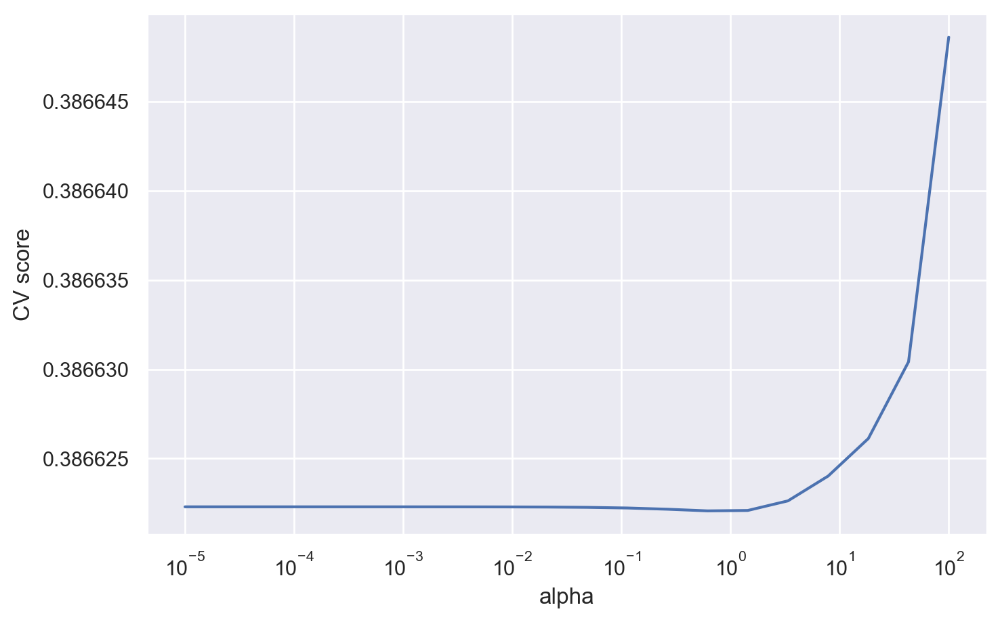

In [71]:
plt.plot(alphas_ridge, -searcher_ridge.cv_results_["mean_test_score"])
plt.xscale("log")
plt.yscale("logit")
plt.xlabel("alpha")
plt.ylabel("CV score");

In [67]:
# результаты до определенного момента очень похожи
-searcher_ridge.cv_results_["mean_test_score"]

array([0.3866223 , 0.3866223 , 0.3866223 , 0.3866223 , 0.3866223 ,
       0.3866223 , 0.38662229, 0.38662229, 0.38662229, 0.38662228,
       0.38662227, 0.38662223, 0.38662216, 0.38662207, 0.38662209,
       0.38662263, 0.38662402, 0.38662612, 0.38663042, 0.3866486 ])

Посчитаем метрики с лучшим параметром `alpha`:

In [73]:
pipeline_ridge = Pipeline(steps=[
    ('ohe_and_scaling', column_transformer),
    ('regression', Ridge(best_alpha_ridge, random_state=13))
])

model_ridge = pipeline_ridge.fit(X_train_small, y_train_small)
pred_test = model_ridge.predict(X_test)
pred_train = model_ridge.predict(X_train_small)

rmse_test = mean_squared_error(pred_test, y_test, squared=False)
rmse_train = mean_squared_error(pred_train, y_train_small, squared=False)

print(f'RMSLE на тесте: {round(rmse_test, 4)}, \nRMSLE на трейне: {round(rmse_train, 4)}')

RMSLE на тесте: 0.4739, 
RMSLE на трейне: 0.3874


Результат практически не изменился. Это логично, учитывая, что найденное перебором оптимальное значение `alpha` (0.6158) близко к тому, которое используется по умолчанию (1.0).

Теперь проделаем аналогичную процедуру для `Lasso`:

In [91]:
# будем перебирать следующие значения
# значений меньше, т.к. их перебор занимает гораздо большее время
alphas_lasso = np.logspace(-5, 0, 10)
alphas_lasso

array([1.00000000e-05, 3.59381366e-05, 1.29154967e-04, 4.64158883e-04,
       1.66810054e-03, 5.99484250e-03, 2.15443469e-02, 7.74263683e-02,
       2.78255940e-01, 1.00000000e+00])

In [92]:
# подбираем alpha
searcher_lasso = GridSearchCV(Lasso(random_state=13), 
        [{"alpha": alphas_lasso}], 
        scoring="neg_root_mean_squared_error", 
        cv=5)

searcher_lasso.fit(X_val_trans, y_val)

best_alpha_lasso = searcher_lasso.best_params_["alpha"]

print("Лучшая alpha = %.4f" % best_alpha_lasso)

Лучшая alpha = 0.0000


In [93]:
# alpha очень маленькая
best_alpha_lasso

1e-05

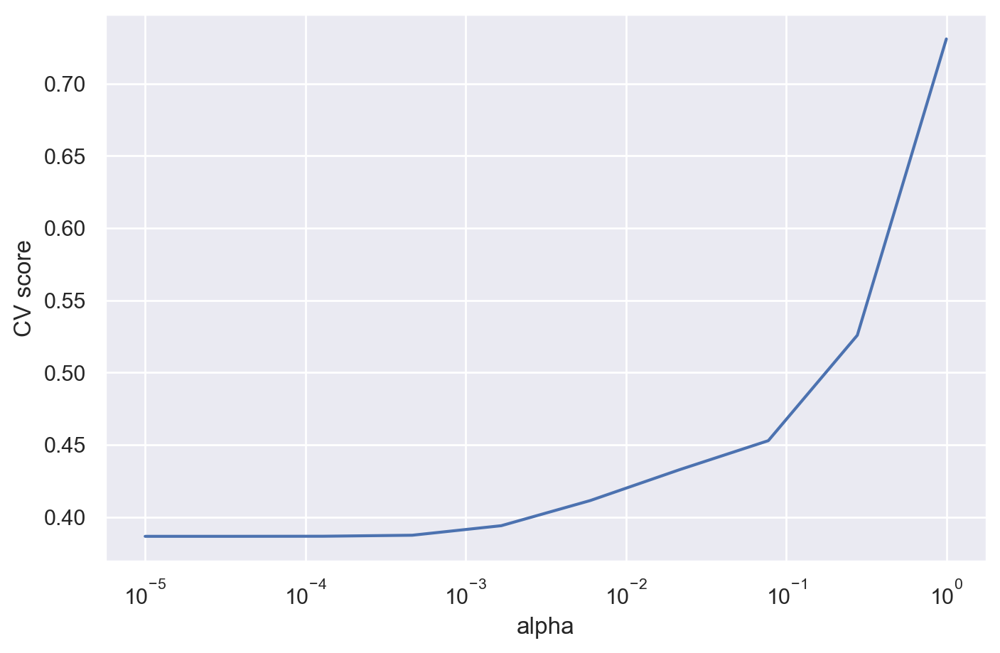

In [94]:
plt.plot(alphas_lasso, -searcher_lasso.cv_results_["mean_test_score"])
plt.xscale("log")
plt.xlabel("alpha")
plt.ylabel("CV score");

*Примечание*: потенциально, судя по графику, если взять значение `alpha` меньше 10e-5, можно достичь лучшего результата, однако при такой попытке появлялось предупреждение о несходимости и требование увеличить коэффициент регуляризации, также `Lasso`-регрессия считалась десятки минут. Да и брать меньшее значение математически и логически слабо обосновано.

In [95]:
pipeline_lasso = Pipeline(steps=[
    ('ohe_and_scaling', column_transformer),
    ('regression', Lasso(best_alpha_lasso, random_state=13))
])

model_lasso = pipeline_lasso.fit(X_train_small, y_train_small)
pred_test = model_lasso.predict(X_test)
pred_train = model_lasso.predict(X_train_small)

rmse_test = mean_squared_error(pred_test, y_test, squared=False)
rmse_train = mean_squared_error(pred_train, y_train_small, squared=False)

print(f'RMSLE на тесте: {round(rmse_test, 4)}, \nRMSLE на трейне: {round(rmse_train, 4)}')

RMSLE на тесте: 0.4739, 
RMSLE на трейне: 0.3873


*Модели показали идентичный результат, но я выберу `Ridge`-регрессию, поскольку она работала гораздо быстрее. У `Lasso`-регрессии были трудности со сходимостью.*

Для каждого перебранного `alpha` для Lasso посчитайте количество нулевых весов в модели и нарисуйте график зависимости его от `alpha`. Как сильно придётся потерять в качестве, если мы хотим с помощью Lasso избавиться хотя бы от половины признаков?

In [108]:
# еще раз переберем эти значения
alphas_lasso

array([1.00000000e-05, 3.59381366e-05, 1.29154967e-04, 4.64158883e-04,
       1.66810054e-03, 5.99484250e-03, 2.15443469e-02, 7.74263683e-02,
       2.78255940e-01, 1.00000000e+00])

In [107]:
# сколько сейчас нулевых весов:

lasso_zeros = np.sum(pipeline_lasso.steps[-1][-1].coef_ == 0)
print("Zero weights in Lasso:", lasso_zeros)

Zero weights in Lasso: 10


In [110]:
# переберем в цикле разные реализации Lasso регрессии с разными гиперпараметрами alpha
# и сохраним нужные значения для визуализации 

lasso_zeros_list = []
score = []
i = 0

for alpha in alphas_lasso:
    print(f'Итерация {i}')
    pipeline_lasso = Pipeline(steps=[
        ('ohe_and_scaling', column_transformer),
        ('regression', Lasso(alpha, random_state=13))
    ])

    model_lasso = pipeline_lasso.fit(X_train_small, y_train_small)
    pred_test = model_lasso.predict(X_test)
    pred_train = model_lasso.predict(X_train_small)

    rmse_test = mean_squared_error(pred_test, y_test, squared=False)
    rmse_train = mean_squared_error(pred_train, y_train_small, squared=False)

    res = (rmse_train, rmse_test)
    score.append(res)

    lasso_zeros = np.sum(pipeline_lasso.steps[-1][-1].coef_ == 0)
    lasso_zeros_list.append(lasso_zeros)
    i += 1

Итерация 0
Итерация 1
Итерация 2
Итерация 3
Итерация 4
Итерация 5
Итерация 6
Итерация 7
Итерация 8
Итерация 9


In [185]:
# отберем значения метрики на тестовой выборке
score_test = [x[1] for x in score]

# столько весов были занулены
print(lasso_zeros_list)

[10, 15, 16, 21, 42, 73, 87, 91, 91, 92]


In [186]:
score_test

[0.47389090011458046,
 0.47389341763605375,
 0.47392799631551935,
 0.47451037959684766,
 0.4799002770378249,
 0.49490752944500094,
 0.5138168562092565,
 0.5322163186116331,
 0.6008337352767723,
 0.7949385168352674]

*Визуализируем связь числа зануленных моделью Lasso весов и значение метрики на соответствующих шагах:*

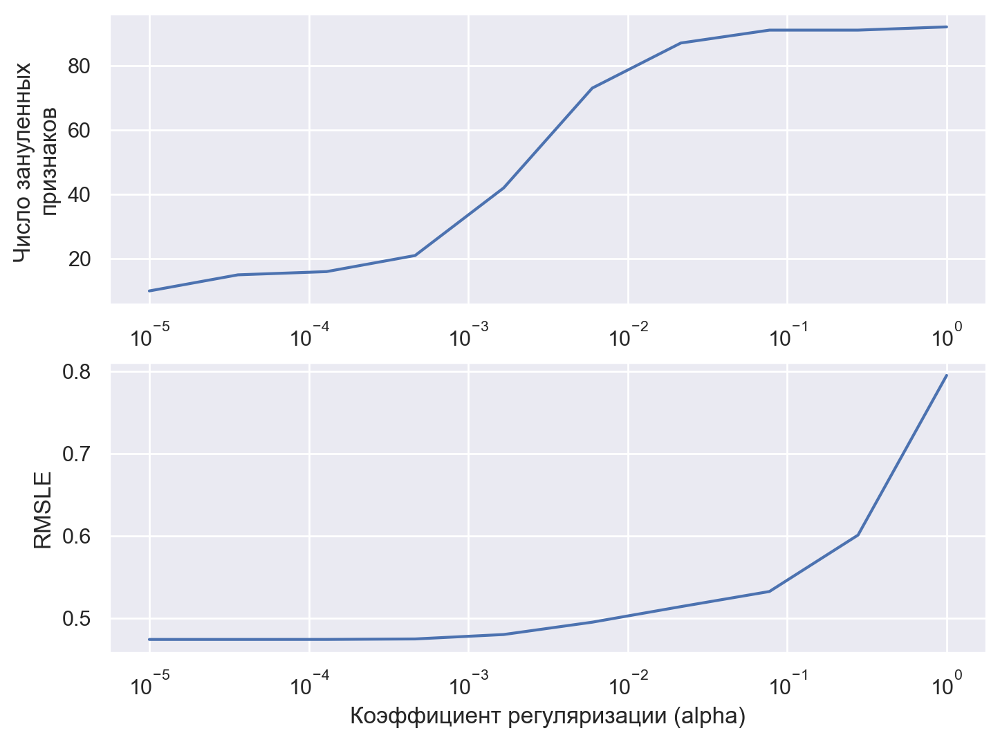

In [172]:
plt.figure(figsize = (18, 6))

plt.subplot(2, 2, 1)
plt.plot(alphas_lasso, lasso_zeros_list)
plt.xlabel("")
plt.xscale("log")
plt.ylabel("Число зануленных \nпризнаков")


plt.subplot(2, 2, 3)
plt.plot(alphas_lasso, score_test)
plt.xscale("log")
plt.xlabel("Коэффициент регуляризации (alpha)")
plt.ylabel("RMSLE")

plt.show()

**Видно, что под конец `Lasso`-регрессия зануляет все (92) признака при значении `alpha=1` и выдает константный прогноз.** Выходит, что при первоначальном сравнении (когда `Ridge` и `Lasso` регрессии обучались с параметрами по умолчанию) мы сравнивали `Ridge`-регрессию с практически оптимальным `alpha` и `Lasso` с константным прогнозом.

*Качеством придется жертвовать относительно не сильно*: при занулении **42 весов из 92** качество модели на тестовой выборке состовляет **0.4799**. Однако на следующем шаге (метрика равна 0.4949) зануляется уже 73 весов - рост стремительный.

<img src="https://www.dropbox.com/s/wp4jj0599np17lh/map_direction.png?raw=1" width="20%" align="right" style="margin-left: 20px">

**Задание 15 (1 балл)**. Часто бывает полезным использовать взаимодействия признаков (feature interactions), то есть строить новые признаки на основе уже существующих. Выше мы разбили карту Манхэттена на ячейки и придумали признаки "из какой ячейки началась поездка" и "в какой ячейке закончилась поездка".

Давайте попробуем сделать следующее: посчитаем, сколько раз встречается каждая возможная пара этих признаков в нашем датасете и выберем 100 самых частых пар. Закодируем поездки с этими частыми парами как категориальный признак, остальным объектам припишем -1. Получается, что мы закодировали, откуда и куда должно было ехать такси.

Также можете придумать ещё какой-нибудь способ сделать признаки про маршрут. Если эти признаки будут давать хороший прирост в качестве, то за это могут быть даны дополнительные бонусные баллы.

**Вопрос**: Почему такой признак потенциально полезный? Почему линейная модель не может самостоятельно "вытащить" эту информацию, ведь у нее в распоряжении есть признаки "из какой ячейки началась поездка" и "в какой ячейке закончилась поездка"?

**Ответ**: линейная модель рассматривает признаки "из какой ячейки началась поездка" и "в какой ячейке закончилась поездка" как независмые, т.е. по отдельности. Они могут коррелировать, тогда их эффект будет "теряться". Коэффициенты при этих признаках означают лишь эффект самого "факта" того, что поездка началась или закончилась в некоторой ячейке, это некоторая "добавка" к итоговому таргету, т.к. это бинарная переменная. Объединяя (или перемножая) мы объединяем их силу, "открываем глаза" модели, вносим дополнительную информацию, что два этих факта (где поездка начаалсь и где закончилась) как-то связаны, т.е. усиливаем модель.

In [119]:
# посмотрим еще раз на сетку
GridTrans.show_map(df=X_train, with_points=True, point_feature='is_manh_pickup', pickup_or_dropoff='pickup')

Размер выборки для визуализации: 925358                 
На карте: 1000 или меньше


In [120]:
X_train.groupby(['box_manh_pickup', 'box_manh_dropoff']).count()['id'].sort_values(ascending=False).head()

box_manh_pickup  box_manh_dropoff
 8                8                  83075
-1               -1                  36847
 7                8                  33410
 12               12                 32298
 8                7                  31592
Name: id, dtype: int64

Здесь возникает несколько вопросов: стоит ли учитывать пары для поедок, не относящихся к Манхэттену (`box_manh_pickup` / `box_manh_dropoff` = -1) и стоит ли учитывать пары, в которых зоны отправления и назначения совпадают (например, (8, 8))?

Я решил поступить следующим образом:
* использовать популярные пары только для поездок, начавшихся и закончившихся в Манхэттене, поскольку
    * их подавляющее большинство
    * "примешивая" к ним поездки "откуда-то" в Манхэттен или наоборот, мы теряем много информации, т.к. "откуда-то" может быть как условным аэропортом, так и соседним районом Бруклин
* учитывать пары, в которых зоны отправления и назначения совпадают, поскольку это тоже может быть интересно: например, поездки внутри "финансового квартала": вероятно, они будут похожими между собой - все в час пик и все короткие и т.д.

In [121]:
# мои пары будут выглядеть так
X_train.loc[(X_train['is_manh_pickup'] == 1) & (X_train['is_manh_dropoff'] == 1)].groupby(['box_manh_pickup', \
    'box_manh_dropoff']).count()['id'].sort_values(ascending=False).head()

box_manh_pickup  box_manh_dropoff
8                8                   83075
7                8                   33410
12               12                  32298
8                7                   31592
7                7                   27892
Name: id, dtype: int64

In [122]:
top_popular_pairs_ind = X_train.loc[(X_train['is_manh_pickup'] == 1) & (X_train['is_manh_dropoff'] == 1)].groupby(['box_manh_pickup', \
    'box_manh_dropoff']).count()['id'].sort_values(ascending=False).index

In [123]:
# отсечем 100 самых популярных
top_100_popular_pairs_ind = top_popular_pairs_ind[:100]

# создадим новые признаки
X_train['pair_manh_number'] = -1
X_test['pair_manh_number'] = -1

for i in range(100):
    X_train.loc[(X_train['box_manh_pickup'] == top_100_popular_pairs_ind[i][0]) & (X_train['box_manh_dropoff'] == top_100_popular_pairs_ind[i][1]), \
        'pair_manh_number'] = i+1

for i in range(100):
    X_test.loc[(X_test['box_manh_pickup'] == top_100_popular_pairs_ind[i][0]) & (X_test['box_manh_dropoff'] == top_100_popular_pairs_ind[i][1]), \
        'pair_manh_number'] = i+1

Посмотрим на визуализацию:

In [124]:
# пример: такси едет отсюда...
GridTrans.show_map(df=X_train, with_points=True, point_feature='pair_manh_number', box_number=2, pickup_or_dropoff='pickup')

Размер выборки для визуализации: 33410                 
На карте: 1000 или меньше


In [125]:
# сюда
GridTrans.show_map(df=X_train, with_points=True, point_feature='pair_manh_number', box_number=2, pickup_or_dropoff='dropoff')

Размер выборки для визуализации: 33410                 
На карте: 1000 или меньше


In [126]:
# добавим новый признак в список кат. признаков
categorical.append('pair_manh_number')

In [128]:
column_transformer = ColumnTransformer([
    ('ohe', OneHotEncoder(), categorical),
    ('scaling', StandardScaler(), numeric)
])

pipeline_ridge = Pipeline(steps=[
    ('ohe_and_scaling', column_transformer),
    ('regression', Ridge(0.6158, random_state=13))
])

model = pipeline_ridge.fit(X_train, y_train)
pred_test = model.predict(X_test)
pred_train = model.predict(X_train)

rmse_test = mean_squared_error(pred_test, y_test, squared=False)
rmse_train = mean_squared_error(pred_train, y_train, squared=False)

print(f'RMSLE на тесте: {round(rmse_test, 4)}, \nRMSLE на трейне: {round(rmse_train, 4)}')

RMSLE на тесте: 0.4648, 
RMSLE на трейне: 0.3766


**Метрики улучшились! Раньше на тесте было 0.4739.**

*Предлагаю создать два новых дополнительных признака на основе координат:*
1. индикатор поездки из одного аэропорта в другой аэропорт (из JFK в LG и наоборот), т.к. такие случаи можно было заметить на карте. Вероятно, такие переезды занимают много времени;
2. индикатор поездки не из Манхэттена не в Манхэттен: то есть, вероятно, эта поездка будет пролегать через сам Манхэттен и занимать какое-то большее время.

Индикатор поездки из одного аэропорта в другой:

In [129]:
# создаем новые признаки
X_train['from_air_to_air'] = 0
X_test['from_air_to_air'] = 0

# проверяем
X_train.loc[((X_train['is_pickup_air_jfk'] == 1) & (X_train['is_dropoff_air_lg'] == 1)) | \
    ((X_train['is_pickup_air_lg'] == 1) & (X_train['is_dropoff_air_jfk'] == 1)), 'from_air_to_air'] += 1

X_test.loc[((X_test['is_pickup_air_jfk'] == 1) & (X_test['is_dropoff_air_lg'] == 1)) | \
    ((X_test['is_pickup_air_lg'] == 1) & (X_test['is_dropoff_air_jfk'] == 1)), 'from_air_to_air'] += 1

In [130]:
# посмотрим на визуализацию
air_subset = X_train.loc[X_train['from_air_to_air'] == 1]

show_circles_on_map(air_subset, "dropoff_latitude", "dropoff_longitude", "blue")

In [131]:
categorical.append('from_air_to_air')

Индикатор поездки не из Манхэттена не в Манхэттен:

In [132]:
# создаем новые признаки
X_train['not_manh'] = 0
X_test['not_manh'] = 0

# проверяем
X_train.loc[(X_train['is_manh_pickup'] == 0) & (X_train['is_manh_dropoff'] == 0), 'not_manh'] += 1
X_test.loc[(X_test['is_manh_pickup'] == 0) & (X_test['is_manh_dropoff'] == 0), 'not_manh'] += 1

In [133]:
# посмотрим на визуализацию: такси едут отсюда...
not_manh_subset = X_train.loc[X_train['not_manh'] == 1]
show_circles_on_map(not_manh_subset.sample(1000), "pickup_latitude", "pickup_longitude", "blue")

In [134]:
# ... сюда
not_manh_subset = X_train.loc[X_train['not_manh'] == 1]
show_circles_on_map(not_manh_subset.sample(1000), "dropoff_latitude", "dropoff_longitude", "blue")

In [135]:
categorical.append('not_manh')

Заново обучите модель (`Ridge`, если она дала более высокое качество в предыдущих экспериментах, и `Lasso` иначе) на новых даннных и посчитайте качество на тестовой выборке

In [136]:
model = pipeline_ridge.fit(X_train, y_train)
pred_test = model.predict(X_test)
pred_train = model.predict(X_train)

rmse_test = mean_squared_error(pred_test, y_test, squared=False)
rmse_train = mean_squared_error(pred_train, y_train, squared=False)

print(f'RMSLE на тесте: {round(rmse_test, 4)}, \nRMSLE на трейне: {round(rmse_train, 4)}')

RMSLE на тесте: 0.4646, 
RMSLE на трейне: 0.3764


*Качество с моими новыми признаками немного улучшилось по сравнению с вариантом, предложенным в задании!*

**Задание 16 (бонус, 1 балл)**. Где, как не для нашей задачи, считать манхэттенское расстояние?

**Вопрос**: Найдите, что такое манхэттенское расстояние и почему оно так называется. Как оно нам может помочь?

**Ответ**: манхэттенское расстояние (или также "расстояние городских кварталов", "расстояние между двумя полями шахматной доски") считает расстояние, если бы мы "ходили" только вверх/вниз и влево/вправо, т.е. как ходит ладья в шахматах. Ему было дано такое название ("манхэттенское") благодаря сходству с планировкой перпендикулярных улиц в одноименном районе Нью-Йорка (да и многих других американских городов). Оно поможет нам, т.к. сейчас мы считаем расстояние как оценку снизу: физическое расстояние от одной точки до другой с учтетом формы Земли - очевидно, машины не летают, да и вертолеты тоже не всегда летят напрямую. Поэтому, учитывая, что большая часть поездок происходит по таким "угловатым" улицам, это расстояние поможет корректнее учитывать необходимый для преодоления путь. *Геометрически оно считается как сумма модулей разностей координат между точками.*

Введите систему координат на нашей карте так, чтобы оси были параллельны улицам Манхэттена, и добавьте сначала в данные признак "манхэттенское расстояние между пунктом отправления и пунктом назначения", а затем и логарифм этого признака. Посчитайте корреляцию между вашим новыми признаком и таргетом; между `log_haversine` и таргетом. В каком случае корреляция больше?

Нарисуйте карту, где покажете выбранные оси. Чтобы мы могли проверить вашу работу, просьба сделать скрин этой карты и приложить картинку (если мы откроем ваш ноутбук, виджеты отображаться не будут). 

In [137]:
# функция из семинара 1
def dummy_manhattan_distance(lat1, lng1, lat2, lng2):
    a = haversine_array(lat1, lng1, lat1, lng2)
    b = haversine_array(lat1, lng1, lat2, lng1)
    return a + b

In [143]:
X_train.loc[:, 'distance_dummy_manhattan'] = dummy_manhattan_distance(X_train['pickup_latitude'].values, X_train['pickup_longitude'].values, \
    X_train['dropoff_latitude'].values, X_train['dropoff_longitude'].values)

X_train['log_distance_dummy_manhattan'] = np.log1p(X_train['distance_dummy_manhattan'].values)

X_test.loc[:, 'distance_dummy_manhattan'] = dummy_manhattan_distance(X_test['pickup_latitude'].values, X_test['pickup_longitude'].values, \
    X_test['dropoff_latitude'].values, X_test['dropoff_longitude'].values)

X_test['log_distance_dummy_manhattan'] = np.log1p(X_test['distance_dummy_manhattan'].values)

In [139]:
corr_data = X_train[['log_distance_dummy_manhattan', 'log_trip_duration']]

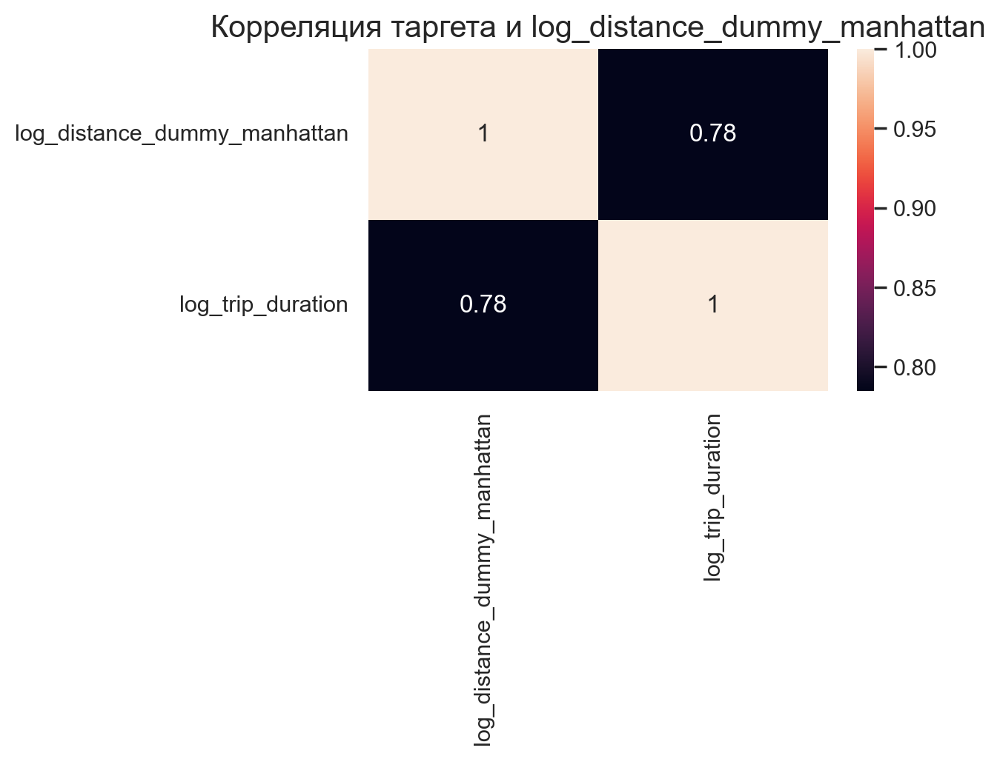

In [140]:
fig, ax = plt.subplots(figsize=(5, 3))
ax = sns.heatmap(data=corr_data.corr(), ax=ax, annot=True)
ax.set_title('Корреляция таргета и log_distance_dummy_manhattan', fontsize=15);

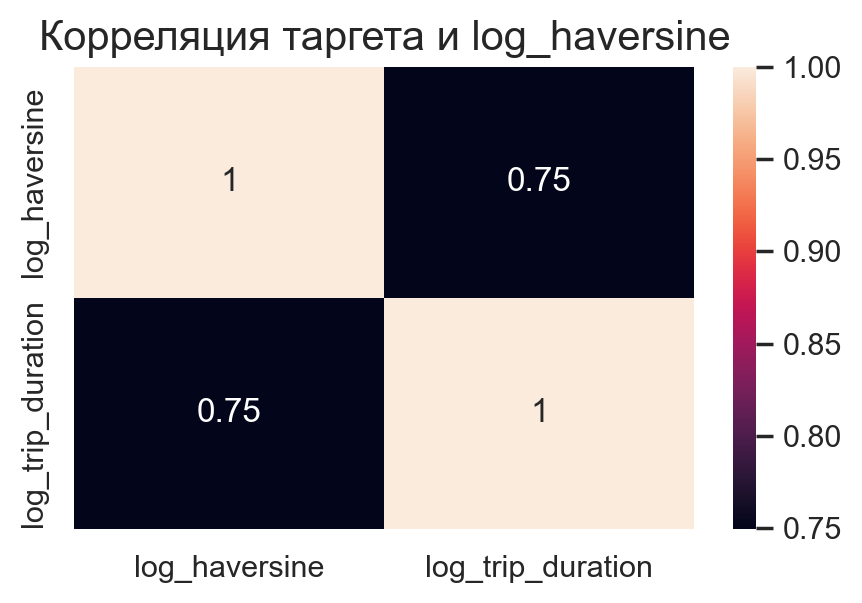

In [196]:
corr_data2 = train[['log_haversine', 'log_trip_duration']]

fig, ax = plt.subplots(figsize=(5, 3))
ax = sns.heatmap(data=corr_data2.corr(), ax=ax, annot=True)
ax.set_title('Корреляция таргета и log_haversine', fontsize=15);

*Корреляция между таргетом и новым расстоянием стала выше: 0.78 для манхэттенского расстояния против 0.75 для логарифма haversine!*

Заново обучите модель на новых даннных и посчитайте качество на тестовой выборке. Стало ли лучше? Объясните полученный результат.

In [198]:
numeric.remove('log_haversine')
numeric.append('log_distance_dummy_manhattan')
numeric

['day_of_year', 'log_distance_dummy_manhattan']

In [199]:
column_transformer = ColumnTransformer([
    ('ohe', OneHotEncoder(), categorical),
    ('scaling', StandardScaler(), numeric)
])

pipeline_ridge = Pipeline(steps=[
    ('ohe_and_scaling', column_transformer),
    ('regression', Ridge(0.6158, random_state=13))
])

model = pipeline_ridge.fit(X_train, y_train)
pred_test = model.predict(X_test)
pred_train = model.predict(X_train)

rmse_test = mean_squared_error(pred_test, y_test, squared=False)
rmse_train = mean_squared_error(pred_train, y_train, squared=False)

print(f'RMSLE на тесте: {round(rmse_test, 4)}, \nRMSLE на трейне: {round(rmse_train, 4)}')

RMSLE на тесте: 0.4742, 
RMSLE на трейне: 0.3883


Однако качество получилось немного хуже: 0.4742 против 0.4646.

Возможно, причина этому необходимость отрегулировать оси, чтобы они совпадали с направлением улиц Манхэттена (ведь сейчас они лежат под углом, расстояние может быть не совсем корректным).

**Задание 17 (бонус, 2 балла)**. Реализуйте трансформер, который строит разбиение карты по шестигранной решётке с помощью библиотеки [H3](https://github.com/uber/h3-py) и вычисляет признаки на основе такого разбиения.

Признаки могут быть самые разные: расстояние между точкой старта и финиша, посчитанное в количестве шестиугольников; статистика по числу поездок и по их продолжительности в соседних шестиугольниках.

Важно: производительность библиотеки существенно зависит от количества шестиугольников на карте (определяется параметром resolution). Подберите такое разрешение, при котором ваш код будет работать за приемлемое время.

При построении признаков старайтесь не допустить утечки целевой переменной (подробнее про это можно почитать в материалах 1-го семинара) — в противном случае хорошего качества на тестовой выборке достичь не получится.

Измерьте качество после добавления новых признаков. За улучшение функционала ошибки на каждые 0.005 на тестовой выборке будет даваться 0.5 бонусных балла. Можно получить до 2 бонусных баллов за это задание.

In [ ]:
#╰( ͡° ͜ʖ ͡° )つ──☆*:・ﾟ

Вставьте картинку, описывающую ваш опыт выполнения этого ДЗ.

<img src="old.jpg" alt="old" width="500"/>